In [2]:
%%capture output
!pip install --upgrade pip
!pip install --upgrade pandas
!pip install tables   
# necessary for pd.read_hdf()

!pip install ipywidgets
!pip install --upgrade jupyter
!pip install IProgress
!pip install catboost
!pip install shap
!pip install anndata

In [3]:
import os
import random
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, GroupKFold
import scipy
import anndata as ad
import shap

/dss/dsshome1/02/di93zoj/.local/lib/python3.8/site-packages/cupy/_environment.py:445: UserWarning: 
--------------------------------------------------------------------------------

  CuPy may not function correctly because multiple CuPy packages are installed
  in your environment:

    cupy-cuda11x, cupy-cuda12x

  Follow these steps to resolve this issue:

    1. For all packages listed above, run the following command to remove all
       existing CuPy installations:

         $ pip uninstall <package_name>

      If you previously installed CuPy via conda, also run the following:

         $ conda uninstall cupy

    2. Install the appropriate CuPy package.
       Refer to the Installation Guide for detailed instructions.

         https://docs.cupy.dev/en/stable/install.html

--------------------------------------------------------------------------------

  warnings.warn(f'''


In [3]:
%matplotlib inline
from tqdm.notebook import tqdm
import gc
import pickle

import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda")
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

## data load

In [4]:
lrz_path = '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/open-problems-multimodal-3rd-solution/'

model_path_for_now = '/dss/dsshome1/02/di93zoj/valentina/open-problems-multimodal-3rd-solution/'

raw_path =  lrz_path + 'input/raw/'  # '../../../input/raw/'

cite_target_path = lrz_path + 'input/target/cite/'   # '../../../input/target/cite/'
cite_feature_path = lrz_path + 'input/features/cite/'   # '../../../input/features/cite/'
cite_mlp_path = lrz_path + 'model/cite/mlp/'   # '../../../model/cite/mlp/'   # '../../../model/cite/mlp/'
cite_cb_path = lrz_path + 'model/cite/cb/'   # '../../../model/cite/cb/'

multi_target_path = lrz_path + 'input/target/multi/'   # '../../../input/target/multi/'
multi_feature_path = lrz_path + 'input/features/multi/'   # '../../../input/features/multi/'
multi_mlp_path = lrz_path + 'model/multi/mlp/'   # '../../../model/multi/mlp/'
multi_cb_path = lrz_path + 'model/multi/cb/'   # '../../../model/multi/cb/'

index_path = lrz_path + 'input/preprocess/cite/'

output_path = lrz_path + 'output/'   # '../../../output/'

## Cite

In [5]:
# get model name
#mlp_model_path = os.listdir(cite_mlp_path)

In [6]:
mlp_model_name = [
    'corr_add_con_imp',
    'corr_last_v3', 
    'corr_c_add_w2v_v1_mish_flg',
    'corr_c_add_w2v_v1_flg',
    'corr_c_add_84_v1',
    'corr_c_add_120_v1',
    'corr_w2v_cell_flg',
    'corr_best_cell_120',
    'corr_cluster_cell',
    'corr_w2v_128',
    'corr_imp_w2v_128',
    'corr_snorm',
    'corr_best_128',
    'corr_best_64',
    'corr_cluster_128',
    'corr_cluster_64',
    'corr_svd_128',
    'corr_svd_64',
             ]

In [7]:
model_name_list = []

for i in mlp_model_name:
    for num, j in enumerate(os.listdir(cite_mlp_path)):
        if i in j:
            model_name_list.append(j)

len(model_name_list)
model_name_list

['cite_mlp_corr_add_con_imp_flg_donor_val_50',
 'cite_mlp_corr_last_v3_flg_donor_val_55',
 'cite_mlp_corr_c_add_w2v_v1_mish_flg_donor_val_66',
 'cite_mlp_corr_c_add_w2v_v1_flg_donor_val_66',
 'cite_mlp_corr_c_add_84_v1_flg_donor_val_47',
 'cite_mlp_corr_c_add_120_v1_flg_donor_val_63',
 'cite_mlp_corr_w2v_cell_flg_donor_val_51',
 'cite_mlp_corr_best_cell_120_flg_donor_val_51',
 'cite_mlp_corr_cluster_cell_flg_donor_val_64',
 'cite_mlp_corr_w2v_128_flg_donor_val_42',
 'cite_mlp_corr_imp_w2v_128_flg_donor_val_38',
 'cite_mlp_corr_snorm_flg_donor_val_39',
 'cite_mlp_corr_best_128_flg_donor_val_45',
 'cite_mlp_corr_best_64_flg_donor_val_50',
 'cite_mlp_corr_cluster_128_flg_donor_val_51',
 'cite_mlp_corr_cluster_64_flg_donor_val_57',
 'cite_mlp_corr_svd_128_flg_donor_val_30',
 'cite_mlp_corr_svd_64_flg_donor_val_38']

In [8]:
weight = [1, 0.3, 1, 1, 1, 1, 1, 1, 1, 0.8, 0.8, 0.8, 0.8, 0.5, 0.5, 0.5, 1, 1, 2, 2]
weight_sum = np.array(weight).sum()
weight_sum

model_feat_dict = {model_name_list[0]:['X_test_add_con_imp.pickle', 1],
                   model_name_list[1]:['X_test_last_v3.pickle', 0.3],
                   model_name_list[2]:['X_test_c_add_w2v_v1.pickle', 1],
                   model_name_list[3]:['X_test_c_add_w2v_v1.pickle', 1],
                   model_name_list[4]:['X_test_c_add_84_v1.pickle', 1],
                   model_name_list[5]:['X_test_c_add_v1.pickle', 1],
                   
                   model_name_list[6]:['X_test_feature_w2v_cell.pickle', 1],
                   model_name_list[7]:['X_test_best_cell_128_120.pickle', 1],
                   model_name_list[8]:['X_test_cluster_cell_128.pickle', 1],
                   
                   model_name_list[9]:['X_test_feature_w2v.pickle', 0.8],
                   model_name_list[10]:['X_test_feature_imp_w2v.pickle',0.8],
                   model_name_list[11]:['X_test_feature_snorm.pickle', 0.8],
                   model_name_list[12]:['X_test_best_128.pickle', 0.8],
                   model_name_list[13]:['X_test_best_64.pickle', 0.5],
                   model_name_list[14]:['X_test_cluster_128.pickle', 0.5],
                   model_name_list[15]:['X_test_cluster_64.pickle', 0.5],
                   model_name_list[16]:['X_test_svd_128.pickle', 1],
                   model_name_list[17]:['X_test_svd_64.pickle', 1],
                   
                   'best_128':['X_test_best_128.pickle', 2],
                   'best_64':['X_test_best_64.pickle', 2],
                  }

### cite model

In [9]:
def std(x):
    x = np.array(x)
    return (x - x.mean(1).reshape(-1, 1)) / x.std(1).reshape(-1, 1)

In [10]:
class CiteDataset(Dataset):
    
    def __init__(self, feature, target):
        
        self.feature = feature
        self.target = target
        
    def __len__(self):
        return len(self.feature)
    
    def __getitem__(self, index):
                
        d = {
            "X": self.feature[index],
            "y" : self.target[index],
        }
        return d

In [11]:
class CiteDataset_test(Dataset):
    
    def __init__(self, feature):
        self.feature = feature
        
    def __len__(self):
        return len(self.feature)
    
    def __getitem__(self, index):
                
        d = {
            "X": self.feature[index]
        }
        return d

In [12]:
def partial_correlation_score_torch_faster(y_true, y_pred):
    """Compute the correlation between each rows of the y_true and y_pred tensors.
    Compatible with backpropagation.
    """
    y_true_centered = y_true - torch.mean(y_true, dim=1)[:,None]
    y_pred_centered = y_pred - torch.mean(y_pred, dim=1)[:,None]
    cov_tp = torch.sum(y_true_centered*y_pred_centered, dim=1)/(y_true.shape[1]-1)
    var_t = torch.sum(y_true_centered**2, dim=1)/(y_true.shape[1]-1)
    var_p = torch.sum(y_pred_centered**2, dim=1)/(y_true.shape[1]-1)
    return cov_tp/torch.sqrt(var_t*var_p)

def correl_loss(pred, tgt):
    """Loss for directly optimizing the correlation.
    """
    return -torch.mean(partial_correlation_score_torch_faster(tgt, pred))

In [13]:
class CiteModel(nn.Module):
    
    def __init__(self, feature_num):
        super(CiteModel, self).__init__()
        
        self.layer_seq_256 = nn.Sequential(nn.Linear(feature_num, 256),
                                           nn.Linear(256, 128),
                                       nn.LayerNorm(128),
                                       nn.ReLU(),
                                      )
        self.layer_seq_64 = nn.Sequential(nn.Linear(128, 64),
                                       nn.Linear(64, 32),
                                       nn.LayerNorm(32),
                                       nn.ReLU(),
                                      )
        self.layer_seq_8 = nn.Sequential(nn.Linear(32, 16),
                                         nn.Linear(16, 8),
                                       nn.LayerNorm(8),
                                       nn.ReLU(),
                                      )
        
        self.head = nn.Linear(128 + 32 + 8, 140)
                   
    def forward(self, X, y=None):
        
        from_numpy = False
        
      ##
        if isinstance(X, np.ndarray):
            X = torch.from_numpy(X)
            from_numpy = True
        X = X.to(device)  # Move the input to the appropriate device if necessary
        ##
        X_256 = self.layer_seq_256(X)
        X_64 = self.layer_seq_64(X_256)
        X_8 = self.layer_seq_8(X_64)
        
        X = torch.cat([X_256, X_64, X_8], axis = 1)
        out = self.head(X)
        
        if from_numpy:
            out = out.cpu().detach().numpy()
            
        return out

In [14]:
class CiteModel_mish(nn.Module):
    
    def __init__(self, feature_num):
        super(CiteModel_mish, self).__init__()
        
        self.layer_seq_256 = nn.Sequential(nn.Linear(feature_num, 256),
                                           nn.Linear(256, 128),
                                       nn.LayerNorm(128),
                                       nn.Mish(),
                                      )
        self.layer_seq_64 = nn.Sequential(nn.Linear(128, 64),
                                       nn.Linear(64, 32),
                                       nn.LayerNorm(32),
                                       nn.Mish(),
                                      )
        self.layer_seq_8 = nn.Sequential(nn.Linear(32, 16),
                                         nn.Linear(16, 8),
                                       nn.LayerNorm(8),
                                       nn.Mish(),
                                      )
        
        self.head = nn.Linear(128 + 32 + 8, 140)
                   
    def forward(self, X, y=None):
    
        X_256 = self.layer_seq_256(X)
        X_64 = self.layer_seq_64(X_256)
        X_8 = self.layer_seq_8(X_64)
        
        X = torch.cat([X_256, X_64, X_8], axis = 1)
        out = self.head(X)
        
        return out

In [15]:
def train_loop(model, optimizer, loader, epoch):
    
    losses, lrs = [], []
    model.train()
    optimizer.zero_grad()
    #loss_fn = nn.MSELoss()
    
    with tqdm(total=len(loader),unit="batch") as pbar:
        pbar.set_description(f"Epoch{epoch}")
        
        for d in loader:
            X = d['X'].to(device)
            y = d['y'].to(device)
            
            logits = model(X)
            loss = correl_loss(logits, y)
            #loss = torch.sqrt(loss_fn(logits, y))
        
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            pbar.set_postfix({"loss":loss.item()})
            pbar.update(1)

    return model

In [16]:
def valid_loop(model, loader, y_val):
    
    model.eval()
    partial_correlation_scores = []
    oof_pred = []
    
    for d in loader:
        with torch.no_grad():
            val_X = d['X'].to(device).float()
            val_y = d['y'].to(device)
            logits = model(val_X)
            oof_pred.append(logits)
    
    #print(torch.cat(oof_pred).shape, torch.cat(oof_pred).detach().cpu().numpy().shape)
    cor = partial_correlation_score_torch_faster(torch.tensor(y_val).to(device), torch.cat(oof_pred))
    cor = cor.mean().item()
    logits = torch.cat(oof_pred).detach().cpu().numpy()
    
    return logits, cor

In [17]:
def test_loop(model, loader):
    
    model.eval()
    predicts=[]

    for d in tqdm(loader):
        with torch.no_grad():
            X = d['X'].to(device)
            logits = model(X)
            predicts.append(logits.detach().cpu().numpy())
            
    return np.concatenate(predicts)

### pred

In [18]:
pred = np.zeros([48203, 140])

for num, i in enumerate(model_feat_dict.keys()):
    
    print(i)
    
    if 'mlp' in i:

        try:
            test_file = model_feat_dict[i][0]
            test_weight = model_feat_dict[i][1]
            X_test = pd.read_pickle(cite_feature_path  + test_file)   
            # print(cite_feature_path  + test_file)
            X_test = np.array(X_test)
            feature_dims = X_test.shape[1]

            test_ds = CiteDataset_test(X_test)
            test_dataloader = DataLoader(test_ds, batch_size=128, pin_memory=True, 
                                         shuffle=False, drop_last=False, num_workers=4)

            if 'mish' in i:
                model = CiteModel_mish(feature_dims)
            else:
                model = CiteModel(feature_dims)

            model = model.to(device)
            model.load_state_dict(torch.load(f'{cite_mlp_path}/{i}'))

            result = test_loop(model, test_dataloader).astype(np.float32)
            result = std(result) * test_weight / weight_sum
            pred += result

            torch.cuda.empty_cache()

        except Exception as e: 
            print(i)
            print(e)             # TODOOOOOOOOOOOOOO
        
    else:
        test_file = model_feat_dict[i][0]
        test_weight = model_feat_dict[i][1]
        X_test = pd.read_pickle(cite_feature_path  + test_file)
        
        cb_pred = np.zeros([48203, 140])
        
        for t in tqdm(range(140)): 
            cb_model_path = [j for j in os.listdir(cite_cb_path) if f'cb_{t}_{i}' in j][0]
            cb = pickle.load(open(cite_cb_path + cb_model_path, 'rb'))
            cb_pred[:,t] = cb.predict(X_test)
            
        cb_pred = cb_pred.astype(np.float32)
        pred += std(cb_pred) * test_weight / weight_sum
        
        del cb_pred

cite_mlp_corr_add_con_imp_flg_donor_val_50


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_last_v3_flg_donor_val_55


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_c_add_w2v_v1_mish_flg_donor_val_66


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_c_add_w2v_v1_flg_donor_val_66


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_c_add_84_v1_flg_donor_val_47


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_c_add_120_v1_flg_donor_val_63


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_w2v_cell_flg_donor_val_51


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_best_cell_120_flg_donor_val_51


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_cluster_cell_flg_donor_val_64


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_w2v_128_flg_donor_val_42
cite_mlp_corr_w2v_128_flg_donor_val_42
pickle data was truncated
cite_mlp_corr_imp_w2v_128_flg_donor_val_38


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_snorm_flg_donor_val_39


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_best_128_flg_donor_val_45


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_best_64_flg_donor_val_50


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_cluster_128_flg_donor_val_51
cite_mlp_corr_cluster_128_flg_donor_val_51
pickle data was truncated
cite_mlp_corr_cluster_64_flg_donor_val_57


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_svd_128_flg_donor_val_30


  0%|          | 0/377 [00:00<?, ?it/s]

cite_mlp_corr_svd_64_flg_donor_val_38


  0%|          | 0/377 [00:00<?, ?it/s]

best_128


  0%|          | 0/140 [00:00<?, ?it/s]

TBB Warning: The number of workers is currently limited to 9. The request for 255 workers is ignored. Further requests for more workers will be silently ignored until the limit changes.



best_64


  0%|          | 0/140 [00:00<?, ?it/s]

In [19]:
cite_sub = pd.DataFrame(pred.round(6))
cite_sub

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139
0,-0.325763,-0.487726,-0.351140,1.035417,0.867362,2.263435,3.314572,-0.490987,-0.422080,-0.312566,-0.516744,-0.479268,-0.392698,-0.437799,2.248492,-0.356820,1.858426,1.438190,0.311870,-0.459440,-0.390224,0.356998,-0.487515,-0.386483,2.933743,-0.493529,-0.496833,-0.490679,-0.519479,-0.486441,-0.499484,-0.456836,-0.462949,-0.465905,-0.445464,-0.486313,-0.406220,3.706034,-0.426988,-0.426960,-0.478347,-0.473531,-0.493517,-0.463647,-0.521283,-0.477249,-0.308774,-0.352580,2.829746,-0.491232,-0.471337,-0.467684,-0.427736,-0.501908,-0.094176,0.147843,-0.470780,1.119076,-0.465103,-0.468748,-0.465728,-0.437897,-0.412050,-0.464621,-0.483278,-0.425702,-0.353304,-0.406930,0.377371,-0.491447,-0.499588,-0.521982,-0.460516,3.233770,-0.502029,1.961047,-0.459220,0.279656,-0.455230,-0.469373,0.169519,-0.508446,-0.244519,-0.434973,-0.501905,-0.498306,-0.441756,-0.476336,-0.357720,-0.479156,-0.351645,-0.498723,-0.471388,-0.378021,0.257157,-0.401406,-0.442542,1.844761,-0.465216,1.572751,0.957415,-0.488888,1.072310,-0.422126,0.028917,-0.414248,1.396667,-0.268086,2.183940,-0.345102,-0.337422,0.395128,-0.390923,-0.465723,-0.479005,0.327378,-0.144509,-0.422018,-0.452277,2.622967,-0.450926,0.406578,-0.475261,-0.482165,-0.423296,-0.416855,-0.487995,-0.307119,-0.448946,-0.488153,-0.513987,1.842090,-0.389790,-0.518201,-0.500584,-0.341137,-0.016152,-0.317287,0.038911,0.358569
1,-0.293318,-0.470175,-0.351411,1.042354,0.918266,2.295311,3.557604,-0.485072,-0.415233,-0.313802,-0.507284,-0.467294,-0.390133,-0.437766,2.081046,-0.379288,1.817835,1.527163,0.218968,-0.443932,-0.396834,0.337888,-0.473513,-0.378367,2.997875,-0.475298,-0.487919,-0.482025,-0.519092,-0.478369,-0.486574,-0.440779,-0.453231,-0.449647,-0.432869,-0.484513,-0.406046,3.649239,-0.414698,-0.415920,-0.476690,-0.462436,-0.486187,-0.507232,-0.513437,-0.466074,-0.308026,-0.362195,2.793727,-0.483063,-0.458914,-0.464759,-0.472134,-0.494446,-0.116079,0.168791,-0.459244,0.760317,-0.473262,-0.456861,-0.456544,-0.430266,-0.406308,-0.449690,-0.480653,-0.419020,-0.357756,-0.404322,0.361024,-0.486177,-0.483510,-0.508228,-0.455940,3.269499,-0.497227,1.836253,-0.448951,0.262897,-0.452101,-0.455520,0.015678,-0.488523,-0.228290,-0.424328,-0.491803,-0.481532,-0.433235,-0.465637,-0.349264,-0.457284,-0.351278,-0.485359,-0.462100,-0.375100,0.195075,-0.387814,-0.433894,1.852684,-0.458724,1.629978,0.989908,-0.481466,1.042113,-0.415024,-0.027019,-0.408085,1.243916,-0.315967,2.307419,-0.338722,-0.338440,0.279176,-0.370073,-0.454231,-0.466989,0.202047,-0.207239,-0.402973,-0.442975,2.643941,-0.447380,0.725472,-0.461778,-0.474484,-0.407501,-0.405370,-0.473237,-0.275037,-0.438760,-0.481082,-0.503041,1.824837,-0.384046,-0.505773,-0.490800,-0.358870,-0.072127,-0.322900,0.059740,0.321170
2,-0.337590,-0.449071,-0.328756,1.541545,1.271158,1.486773,4.438061,-0.463586,-0.391265,-0.423717,-0.490488,-0.432057,-0.413593,-0.419563,3.425921,-0.273074,1.050498,1.232070,-0.147873,-0.459549,-0.391286,0.349073,-0.452593,-0.377868,2.946160,-0.457365,-0.465518,-0.456000,-0.552825,-0.449000,-0.464035,-0.396618,-0.427663,-0.421797,-0.406927,-0.461766,-0.376777,3.081342,-0.390259,-0.414921,-0.445016,-0.445863,-0.436062,-0.241539,-0.477302,-0.428374,-0.259132,-0.387491,0.834359,-0.462515,-0.428087,-0.450839,-0.397859,-0.472636,-0.105842,0.155864,-0.442646,0.735282,-0.463941,-0.440932,-0.214514,-0.390995,-0.372148,-0.421931,-0.428421,-0.395625,-0.315518,-0.405781,0.398098,-0.453097,-0.445482,-0.482220,-0.441450,1.487032,-0.439813,1.227329,-0.422023,0.056511,-0.423029,-0.429001,-0.157044,-0.457500,-0.1489

In [20]:
#cite_sub.to_csv('../../../../../summary/output/submit/cite_submit.csv')

In [21]:
# model #16: cite_mlp_corr_svd_128_flg_donor_val_30
pred_16 = np.zeros([48203, 140])

i = 'cite_mlp_corr_svd_128_flg_donor_val_30'
        
test_file = model_feat_dict[i][0]
test_weight = model_feat_dict[i][1]
X_test = pd.read_pickle(cite_feature_path  + test_file)
X_test = np.array(X_test)
feature_dims = X_test.shape[1]

test_ds = CiteDataset_test(X_test)
test_dataloader = DataLoader(test_ds, batch_size=128, pin_memory=True, 
                              shuffle=False, drop_last=False, num_workers=4)

if 'mish' in i:
    model = CiteModel_mish(feature_dims)
else:
    model = CiteModel(feature_dims)
    
model = model.to(device)
model.load_state_dict(torch.load(f'{cite_mlp_path}/{i}'))

result = test_loop(model, test_dataloader).astype(np.float32)
pred_16 += result

torch.cuda.empty_cache()
        
pd.DataFrame(pred_16)   # double check train_cite_targets.h5  -> omnipath

  0%|          | 0/377 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139
0,-1.066214,-1.500514,-1.354732,1.106293,0.870050,3.481026,5.068963,-1.570376,-1.444427,-1.320805,-1.612072,-1.534025,-1.428721,-1.496726,3.095443,-1.384179,2.648670,1.938127,-0.093395,-1.635635,-1.428060,-0.072685,-1.464743,-1.333562,4.527912,-1.577124,-1.570286,-1.564539,-1.633427,-1.551505,-1.606172,-1.489064,-1.542060,-1.542368,-1.515886,-1.584888,-1.483260,6.079505,-1.523131,-1.523235,-1.628157,-1.568854,-1.554411,-1.576220,-1.606886,-1.563621,-1.300686,-1.282660,4.529592,-1.497973,-1.504544,-1.616752,-1.605089,-1.590274,-0.912922,-0.373879,-1.571137,1.285796,-1.561718,-1.562619,-1.531306,-1.546421,-1.493748,-1.614748,-1.581693,-1.436407,-1.352794,-1.433355,0.004909,-1.507425,-1.582314,-1.650570,-1.553576,5.307981,-1.614865,2.938022,-1.565206,-0.132294,-1.512818,-1.525933,-0.179090,-1.617116,-1.141692,-1.497717,-1.589772,-1.619874,-1.517951,-1.527505,-1.324580,-1.536241,-1.349130,-1.607751,-1.596411,-1.449581,-0.069317,-1.395716,-1.459355,2.709944,-1.504535,2.280894,1.127364,-1.582485,1.390227,-1.485381,-0.814069,-1.483875,1.818619,-1.166677,3.552196,-1.324413,-1.333009,-0.007728,-1.370064,-1.791087,-1.608294,-0.100307,-0.916059,-1.476894,-1.569606,4.021826,-1.475892,0.135268,-1.601359,-1.499203,-1.508152,-1.504639,-1.617095,-1.286001,-1.497401,-1.602236,-1.585815,2.483777,-1.404219,-1.656769,-1.628225,-1.330440,-1.008045,-1.255912,-0.622693,-0.130889
1,-1.066863,-1.506922,-1.399234,1.075622,0.997000,3.506276,5.482270,-1.564518,-1.460713,-1.301635,-1.630553,-1.572386,-1.490486,-1.531075,3.169134,-1.427280,2.469891,2.130680,-0.441177,-1.637263,-1.472090,-0.058173,-1.472274,-1.346527,4.738336,-1.580682,-1.617853,-1.605993,-1.660454,-1.576261,-1.645343,-1.516035,-1.583861,-1.545192,-1.542169,-1.601968,-1.507294,6.134769,-1.544438,-1.598331,-1.658047,-1.569850,-1.591335,-1.617602,-1.622319,-1.573246,-1.365243,-1.374660,4.661470,-1.514932,-1.525291,-1.650623,-1.612996,-1.614320,-1.050468,-0.368882,-1.596777,0.777628,-1.589302,-1.581178,-1.578824,-1.556400,-1.516197,-1.611206,-1.631125,-1.470564,-1.411186,-1.485467,-0.118137,-1.505673,-1.588789,-1.651942,-1.589074,5.179163,-1.639682,2.676197,-1.584316,-0.139513,-1.552863,-1.553032,-0.562212,-1.614021,-1.148399,-1.525630,-1.601072,-1.632259,-1.561790,-1.547848,-1.396463,-1.548854,-1.390113,-1.631644,-1.603295,-1.467893,-0.253803,-1.409185,-1.494895,2.745371,-1.549434,2.248627,0.980010,-1.594085,1.342902,-1.517551,-0.857593,-1.512605,1.534007,-1.340090,3.737964,-1.391071,-1.371286,-0.343289,-1.380606,-1.574049,-1.623918,-0.251533,-1.224228,-1.529290,-1.581505,4.152058,-1.492644,0.828691,-1.611809,-1.553908,-1.532021,-1.513875,-1.643902,-1.266918,-1.511767,-1.586282,-1.620556,2.777603,-1.404080,-1.657566,-1.687855,-1.422948,-0.779982,-1.299691,-0.628081,-0.121451
2,-1.010483,-1.271475,-1.207541,2.074138,1.614699,2.007854,6.589703,-1.375048,-1.260441,-1.450449,-1.464528,-1.332167,-1.378688,-1.357362,4.944631,-1.135803,0.924207,1.518125,-0.864301,-1.520575,-1.308289,0.001369,-1.352341,-1.241100,4.492318,-1.413134,-1.387935,-1.475024,-1.551049,-1.376211,-1.415567,-1.233553,-1.391606,-1.319302,-1.332554,-1.431551,-1.287800,4.749259,-1.345552,-1.431708,-1.396523,-1.397866,-1.361056,-1.084544,-1.420402,-1.334421,-1.064826,-1.288270,1.084383,-1.353258,-1.357908,-1.394108,-1.357524,-1.375949,-0.872823,-0.296498,-1.411045,0.364861,-1.434200,-1.399387,-0.980367,-1.282705,-1.286859,-1.391187,-1.348682,-1.279702,-1.213787,-1.296815,0.074660,-1.323076,-1.356954,-1.430774,-1.481459,2.078271,-1.360491,1.682164,-1.313901,-0.382103,-1.374237,-1.361103,-0.

### prediction with private test input -> should get private test target

In [4]:
private_test_input = ad.read('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/large_preprocessed_files/private_test_input.h5ad')
private_test_input

AnnData object with n_obs × n_vars = 26867 × 22085
    obs: 'kaggle_dataset', 'day', 'donor', 'cell_type'

In [5]:
private_test_target = ad.read('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/large_preprocessed_files/private_test_target.h5ad')
private_test_target

AnnData object with n_obs × n_vars = 26867 × 140
    obs: 'kaggle_dataset', 'day', 'donor', 'cell_type'

In [6]:
private_test_target_raw = ad.read('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/large_preprocessed_files/private_test_target_raw.h5ad')
private_test_target_raw

AnnData object with n_obs × n_vars = 26867 × 140
    obs: 'kaggle_dataset', 'day', 'donor', 'cell_type'

In [9]:
with open('private_X_test_svd.pkl', 'rb') as f:  # private_X_test_svd

    private_X_test_svd = pickle.load(f)
private_X_test_svd.shape

(26867, 212)

In [10]:
with open('private_X_test_svd_from_raw.pkl', 'rb') as f:  # private_X_test_svd

    private_X_test_svd_from_raw = pickle.load(f)
private_X_test_svd_from_raw.shape

(26867, 212)

In [11]:
# model #16: cite_mlp_corr_svd_128_flg_donor_val_30
pred_16 = np.zeros([26867, 140])

i = 'cite_mlp_corr_svd_128_flg_donor_val_30'
        
# test_file = model_feat_dict[i][0]
# test_weight = model_feat_dict[i][1]
X_test = private_X_test_svd_from_raw
X_test = np.array(X_test)
feature_dims = X_test.shape[1]

test_ds = CiteDataset_test(X_test)
test_dataloader = DataLoader(test_ds, batch_size=128, pin_memory=True, 
                              shuffle=False, drop_last=False, num_workers=4)

if 'mish' in i:
    model = CiteModel_mish(feature_dims)
else:
    model = CiteModel(feature_dims)
    
model = model.to(device)
model.load_state_dict(torch.load(f'{cite_mlp_path}/{i}'))

result = test_loop(model, test_dataloader).astype(np.float32)
pred_16 += result

torch.cuda.empty_cache()
        
pd.DataFrame(pred_16)

NameError: name 'CiteDataset_test' is not defined

In [51]:
pd.DataFrame(private_test_target.X)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139
0,8.875269,1.072714,0.349734,2.983766,3.551555,10.595364,17.327169,-0.144145,1.184181,3.041042,-0.429325,1.182045,0.099277,0.779827,8.188025,-0.270990,8.430601,1.836533,0.745340,-0.351743,0.439735,0.765868,1.125316,1.748645,19.122791,-0.242279,0.408039,2.850391,1.086136,-1.090475,0.438324,0.488942,-0.207521,0.550487,1.475966,1.382768,0.295792,8.440279,-0.722296,-0.775979,0.062518,0.936198,0.994711,18.807247,0.172296,0.722737,0.910600,0.162670,6.142643,0.404690,0.376773,1.482086,5.648309,-0.472074,0.724059,1.284304,-0.434013,0.619052,0.485545,3.045351,-0.635869,-0.436930,0.655264,0.467037,0.579335,-0.508544,0.959657,-0.067105,1.270376,0.234640,0.066366,0.192507,-0.682262,17.483824,-0.892266,10.238394,1.745744,2.714039,-0.701813,0.747299,0.877073,1.563599,1.058956,-0.457277,1.228947,0.388389,-0.010542,0.267340,5.669645,7.474632,1.808860,-0.199814,1.059669,-1.377614,0.698028,2.975605,0.312312,7.067345,0.448233,3.165192,1.711047,-0.512108,13.989281,-0.319555,1.991211,1.292144,8.198327,-0.497042,1.667113,0.175193,0.952262,2.701510,0.315933,1.213420,-0.912409,-0.586749,3.214163,-0.050946,0.610855,9.844093,-1.327427,6.832107,0.191609,-0.512926,0.011371,-0.843791,0.625344,1.954184,0.247891,1.342433,0.191373,11.086969,0.300469,0.805080,-0.291616,1.635413,7.509739,6.417010,-0.497571,3.759374
1,-0.331542,0.871559,0.484194,-0.784014,4.173365,5.242312,3.511576,1.208851,0.547345,-1.133742,1.118824,1.442501,0.455243,0.283438,6.993079,-0.026130,10.230215,2.101537,3.080711,-0.216307,0.533936,-0.498301,2.256030,0.834251,9.049059,0.779667,0.682752,0.573576,0.962821,0.293053,-0.178916,0.821061,0.655331,0.348021,-0.402928,0.473780,1.412509,16.912354,0.567827,-0.521395,-0.492781,0.638112,0.850088,-0.706945,0.518396,0.035253,1.234597,-0.144053,5.296485,0.349541,-0.509136,0.525733,0.911987,-0.256126,1.823956,1.146885,1.171728,3.219068,-0.451023,-0.466942,-0.415797,0.597951,-0.374317,1.043082,-0.423951,-0.193910,-0.043685,-0.116682,1.089144,1.671674,-0.377057,0.667307,0.713002,5.564362,-0.546455,9.313555,0.059604,1.048921,-0.461957,-0.665786,2.390503,-0.422717,-1.041684,1.245956,0.860920,1.365275,1.652736,1.011294,1.224288,0.010108,0.349052,-0.914434,0.693691,-0.017469,2.352008,-0.068106,0.663223,4.722332,-0.148873,3.343668,3.256628,-0.358878,2.278013,-1.183820,-0.309653,-0.683214,5.749076,1.312526,5.519828,0.472522,2.021698,2.179903,-0.207124,0.175539,-0.611545,2.168428,1.053179,0.262963,0.815993,-0.660271,1.183417,9.385386,2.176677,-0.303985,0.339248,-0.497396,0.404140,0.547107,0.947232,0.477131,0.310369,7.197814,-0.425260,-0.154081,-0.124246,-0.106671,3.812726,-0.155547,1.029169,3.598739
2,-0.211242,0.736260,1.096481,1.892444,1.585475,3.669683,2.232614,-1.042255,0.724554,0.833527,0.654052,1.568456,1.693014,1.225370,2.855914,0.092283,0.469575,1.260003,2.548044,-0.150811,0.455052,1.280808,-0.480674,0.291739,2.320207,0.187424,1.809985,0.079923,1.468113,1.157402,0.739877,-0.197212,-0.863157,1.058822,-0.267103,-0.118149,-0.085934,5.851235,-0.486316,-0.398280,0.354495,-0.619301,-0.555109,3.469603,-0.162294,-0.094670,1.391279,0.013668,-0.517603,0.099101,0.738166,1.355466,-0.590801,1.464079,6.004411,0.804768,0.427432,1.580613,0.833697,0.736071,2.144272,1.333905,-0.193387,1.040795,10.899550,1.741197,0.114915,0.051703,2.828831,0.678737,0.498896,0.860332,-0.265413,2.195580,0.749844,2.715751,0.203019,2.059091,0.831223,1.163601,1.132976,0.591543,0.990607,0.081153,2.316111,1.534367,0.996560,2.787698,0.651980,0.108140,0.825298,1.685943,-0.054280,0.446149,1.579761,0.015828,1.739001,6.939562,-1.162202,4.748300,0.575198,-0.

In [49]:
pd.DataFrame(private_test_target_raw.X.toarray())

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139
0,10.0,8.0,11.0,7.0,30.0,15.0,21.0,2.0,23.0,9.0,1.0,1.0,4.0,2.0,6.0,0.0,14.0,9.0,2.0,0.0,12.0,8.0,2.0,4.0,23.0,1.0,1.0,7.0,17.0,11.0,10.0,3.0,2.0,3.0,2.0,9.0,4.0,6.0,4.0,0.0,4.0,3.0,5.0,60.0,4.0,10.0,2.0,2.0,6.0,5.0,14.0,9.0,11.0,0.0,5.0,22.0,4.0,3.0,1.0,4.0,0.0,28.0,12.0,12.0,1.0,1.0,3.0,4.0,9.0,2.0,39.0,36.0,0.0,23.0,5.0,20.0,4.0,9.0,0.0,2.0,1.0,3.0,13.0,2.0,3.0,2.0,8.0,4.0,28.0,21.0,13.0,11.0,46.0,3.0,5.0,1.0,3.0,25.0,7.0,7.0,11.0,0.0,7.0,2.0,6.0,3.0,13.0,0.0,27.0,1.0,10.0,8.0,4.0,1.0,0.0,0.0,9.0,1.0,1.0,16.0,0.0,18.0,1.0,0.0,4.0,1.0,3.0,9.0,5.0,9.0,13.0,22.0,3.0,36.0,0.0,11.0,48.0,39.0,5.0,17.0
1,0.0,6.0,10.0,0.0,34.0,6.0,3.0,4.0,16.0,0.0,3.0,1.0,4.0,1.0,5.0,0.0,18.0,9.0,5.0,0.0,11.0,3.0,3.0,2.0,8.0,2.0,1.0,2.0,14.0,17.0,6.0,3.0,3.0,2.0,0.0,5.0,6.0,15.0,7.0,0.0,2.0,2.0,4.0,0.0,4.0,6.0,2.0,1.0,5.0,4.0,8.0,5.0,2.0,0.0,7.0,19.0,8.0,8.0,0.0,0.0,0.0,35.0,6.0,13.0,0.0,1.0,1.0,3.0,7.0,4.0,29.0,37.0,1.0,5.0,5.0,17.0,1.0,4.0,0.0,0.0,2.0,0.0,3.0,5.0,2.0,3.0,14.0,5.0,6.0,1.0,6.0,6.0,36.0,6.0,9.0,0.0,3.0,14.0,4.0,7.0,17.0,0.0,1.0,0.0,1.0,0.0,8.0,1.0,153.0,1.0,13.0,6.0,2.0,0.0,0.0,2.0,3.0,1.0,1.0,0.0,4.0,28.0,3.0,0.0,4.0,1.0,2.0,4.0,6.0,5.0,12.0,12.0,1.0,22.0,0.0,4.0,18.0,3.0,9.0,15.0
2,0.0,5.0,12.0,4.0,15.0,4.0,2.0,0.0,16.0,3.0,2.0,1.0,7.0,2.0,2.0,0.0,1.0,6.0,4.0,0.0,10.0,8.0,0.0,1.0,2.0,1.0,2.0,1.0,16.0,22.0,9.0,1.0,0.0,3.0,0.0,3.0,2.0,4.0,3.0,0.0,4.0,0.0,1.0,5.0,2.0,5.0,2.0,1.0,0.0,3.0,13.0,7.0,0.0,1.0,24.0,16.0,5.0,4.0,1.0,1.0,2.0,42.0,6.0,12.0,14.0,4.0,1.0,3.0,13.0,2.0,37.0,37.0,0.0,2.0,9.0,4.0,1.0,6.0,1.0,2.0,1.0,1.0,10.0,2.0,4.0,3.0,10.0,10.0,4.0,1.0,7.0,19.0,26.0,7.0,6.0,0.0,5.0,23.0,1.0,10.0,5.0,0.0,2.0,4.0,2.0,0.0,6.0,0.0,152.0,20.0,8.0,36.0,0.0,0.0,2.0,0.0,4.0,1.0,0.0,11.0,2.0,6.0,0.0,0.0,2.0,3.0,2.0,8.0,6.0,2.0,9.0,15.0,5.0,29.0,0.0,6.0,7.0,5.0,7.0,8.0
3,4.0,8.0,11.0,5.0,40.0,10.0,13.0,4.0,29.0,2.0,5.0,0.0,5.0,1.0,7.0,0.0,3.0,6.0,3.0,0.0,18.0,7.0,1.0,5.0,9.0,3.0,1.0,2.0,13.0,24.0,6.0,4.0,2.0,3.0,2.0,6.0,6.0,2.0,8.0,0.0,3.0,2.0,5.0,24.0,6.0,9.0,1.0,2.0,3.0,3.0,12.0,3.0,3.0,0.0,6.0,14.0,5.0,6.0,1.0,0.0,3.0,41.0,15.0,11.0,3.0,4.0,0.0,4.0,12.0,2.0,49.0,37.0,1.0,28.0,7.0,0.0,1.0,4.0,0.0,1.0,3.0,4.0,12.0,3.0,1.0,2.0,10.0,3.0,13.0,2.0,5.0,9.0,49.0,5.0,9.0,0.0,2.0,28.0,4.0,7.0,6.0,0.0,4.0,3.0,2.0,0.0,5.0,0.0,47.0,14.0,10.0,8.0,7.0,1.0,1.0,0.0,4.0,1.0,0.0,11.0,1.0,7.0,1.0,0.0,3.0,1.0,0.0,5.0,3.0,7.0,11.0,10.0,5.0,34.0,0.0,6.0,39.0,13.0,10.0,15.0
4,0.0,3.0,10.0,1.0,14.0,3.0,3.0,2.0,11.0,2.0,0.0,0.0,2.0,0.0,3.0,0.0,1.0,2.0,2.0,0.0,4.0,5.0,1.0,1.0,4.0,0.0,0.0,0.0,3.0,9.0,2.0,1.0,3.0,1.0,0.0,2.0,3.0,1.0,4.0,1.0,3.0,2.0,2.0,3.0,5.0,11.0,0.0,4.0,1.0,0.0,5.0,2.0,0.0,1.0,3.0,11.0,2.0,1.0,0.0,0.0,0.0,27.0,7.0,4.0,0.0,1.0,2.0,1.0,7.0,2.0,22.0,17.0,1.0,0.0,8.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,1.0,0.0,1.0,2.0,0.0,0.0,7.0,4.0,23.0,3.0,6.0,0.0,0.0,15.0,2.0,2.0,7.0,0.0,0.0,3.0,14.0,0.0,2.0,0.0,34.0,1.0,5.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,8.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,7.0,3.0,2.0,7.0,3.0,1.0,15.0,0.0,6.0,8.0,1.0,6.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26862,0.0,6.0,4.0,11.0,31.0

In [50]:
pd.concat([pd.DataFrame(pred_16), pd.DataFrame(private_test_target.X)]).corr().head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139
0,1.000000,0.459690,0.582097,0.580557,0.491400,0.381093,0.537212,0.430136,0.547665,0.585130,0.569132,0.538646,0.545971,0.538830,0.470409,0.510190,0.423378,0.466647,0.498483,0.456688,0.563295,0.144980,0.521271,0.586280,0.367580,0.608062,0.566845,0.563967,0.564961,0.556350,0.552460,0.530502,0.550973,0.551241,0.551521,0.551346,0.531775,0.171044,0.533156,0.518216,0.102500,0.531640,0.585775,0.406519,0.529440,0.551094,0.470095,0.428372,0.268616,0.564222,0.550431,0.562956,0.519051,0.569685,0.504918,0.580411,0.561885,0.321049,0.523333,0.580321,0.604472,0.577826,0.536468,0.531100,0.429802,0.516862,0.456810,0.536133,0.499126,0.463094,0.519332,0.497877,0.548090,0.395358,0.566044,0.314225,0.541349,0.392113,0.541551,0.266539,0.474492,0.161349,0.552052,0.533705,0.565687,0.558962,0.574195,0.543005,0.462983,0.067325,0.528498,0.508278,0.544898,0.544147,0.548381,0.453769,0.385220,0.493705,0.548447,0.153366,0.569676,0.548954,0.351682,0.528169,0.393751,0.545005,0.592323,0.546521,0.176776,0.443301,0.439475,0.465358,0.405280,0.106895,0.585985,0.318636,0.498757,0.562315,0.531940,0.510734,0.543306,0.167287,0.551800,0.535075,0.544366,0.541669,0.546160,0.580810,0.549512,0.529738,0.575900,0.475632,0.518621,0.503746,0.526160,0.561883,0.483022,0.447519,0.260438,0.380905
1,0.459690,1.000000,0.828926,0.621133,0.655242,0.580699,0.141734,0.726909,0.806570,0.709244,0.755355,0.638120,0.797692,0.724128,0.159194,0.290973,0.535481,0.419801,0.537265,0.470848,0.735781,0.590509,0.652721,0.753454,0.156278,0.667467,0.684671,0.771257,0.819177,0.834214,0.830766,0.719602,0.806879,0.790392,0.675357,0.803292,0.775839,0.512892,0.841573,0.668169,0.138802,0.741486,0.708883,0.482089,0.782088,0.844362,0.649615,0.830650,0.137923,0.799703,0.817584,0.774748,0.611660,0.624871,0.754243,0.754694,0.811457,0.299381,0.588287,0.667099,0.543823,0.806315,0.822479,0.848774,0.371486,0.717109,0.638747,0.811927,0.745656,0.434154,0.844923,0.836190,0.697528,0.141473,0.810279,0.377350,0.720982,0.436217,0.652185,0.686789,0.233799,0.574424,0.835509,0.810410,0.749708,0.769662,0.821083,0.823430,0.613883,0.521404,0.775590,0.829989,0.855065,0.785206,0.628657,0.496622,0.821501,0.659991,0.814542,0.452507,0.755071,0.565650,0.146864,0.736254,0.460236,0.684780,0.515595,0.627237,0.276509,0.320244,0.653025,0.681716,0.298782,0.488557,0.522028,0.258031,0.678909,0.718402,0.470872,0.315808,0.807253,0.515124,0.705547,0.610315,0.753773,0.784375,0.786774,0.678034,0.799766,0.853250,0.806213,0.360796,0.736066,0.825994,0.409027,0.826687,0.388789,0.417239,0.411004,0.621091
2,0.582097,0.828926,1.000000,0.695219,0.642914,0.480815,0.259043,0.740618,0.929275,0.816682,0.846743,0.768761,0.873778,0.827614,0.298455,0.376747,0.523759,0.512059,0.656680,0.591528,0.892650,0.410848,0.756144,0.827794,0.273873,0.783191,0.812451,0.849325,0.890759,0.912986,0.907619,0.859104,0.878408,0.867880,0.796409,0.893984,0.886932,0.328116,0.910352,0.776981,0.148454,0.852477,0.843906,0.419157,0.809560,0.892558,0.780531,0.736436,0.220488,0.893060,0.923561,0.899962,0.705365,0.756022,0.840119,0.871292,0.904614,0.375069,0.730185,0.792510,0.669971,0.861645,0.890609,0.887229,0.471524,0.838433,0.775357,0.889976,0.820526,0.524692,0.850277,0.835320,0.805391,0.251802,0.885466,0.457301,0.844525,0.567047,0.775243,0.534502,0.330394,0.376979,0.865449,0.888140,0.839454,0.856559,0.910863,0.866760,0.693803,0.281675,0.902857,0.840112,0.892303,0.910913,0.670808,0.582091,0.726015,0.635118,0.904440,0.314222,0.785473,0.710555,0.241639,0.867574,0.584648,0.794047,0.587971,0.752536,0.420622,0.438737,0.778829,0.652882,0.385214,0.3060

In [ ]:
# TODO check svd output to see if svd model is correct

### - add cell_ids to train and test data
### - SHAP

In [34]:
train_ids = np.load(index_path + "train_cite_raw_inputs_idxcol.npz", allow_pickle=True)
test_ids = np.load(index_path + "test_cite_raw_inputs_idxcol.npz", allow_pickle=True)

train_index = train_ids["index"]
train_column = train_ids["columns"]
test_index = test_ids["index"]
print(len(list(train_index)))
print(len(list(test_index)))
X_train_cell_ids = pd.read_pickle(cite_feature_path  + 'X_svd_128.pickle')   # = X_svd_128 in make-features second to last cell
X_train_cell_ids.index = train_index
X_train_cell_ids

70988
48203


,base_svd_0,base_svd_1,base_svd_2,base_svd_3,base_svd_4,base_svd_5,base_svd_6,base_svd_7,base_svd_8,base_svd_9,base_svd_10,base_svd_11,base_svd_12,base_svd_13,base_svd_14,base_svd_15,base_svd_16,base_svd_17,base_svd_18,base_svd_19,base_svd_20,base_svd_21,base_svd_22,base_svd_23,base_svd_24,base_svd_25,base_svd_26,base_svd_27,base_svd_28,base_svd_29,base_svd_30,base_svd_31,base_svd_32,base_svd_33,base_svd_34,base_svd_35,base_svd_36,base_svd_37,base_svd_38,base_svd_39,base_svd_40,base_svd_41,base_svd_42,base_svd_43,base_svd_44,base_svd_45,base_svd_46,base_svd_47,base_svd_48,base_svd_49,base_svd_50,base_svd_51,base_svd_52,base_svd_53,base_svd_54,base_svd_55,base_svd_56,base_svd_57,base_svd_58,base_svd_59,base_svd_60,base_svd_61,base_svd_62,base_svd_63,base_svd_64,base_svd_65,base_svd_66,base_svd_67,base_svd_68,base_svd_69,base_svd_70,base_svd_71,base_svd_72,base_svd_73,base_svd_74,base_svd_75,base_svd_76,base_svd_77,base_svd_78,base_svd_79,base_svd_80,base_svd_81,base_svd_82,base_svd_83,base_svd_84,base_svd_85,base_svd_86,base_svd_87,base_svd_88,base_svd_89,base_svd_90,base_svd_91,base_svd_92,base_svd_93,base_svd_94,base_svd_95,base_svd_96,base_svd_97,base_svd_98,base_svd_99,base_svd_100,base_svd_101,base_svd_102,base_svd_103,base_svd_104,base_svd_105,base_svd_106,base_svd_107,base_svd_108,base_svd_109,base_svd_110,base_svd_111,base_svd_112,base_svd_113,base_svd_114,base_svd_115,base_svd_116,base_svd_117,base_svd_118,base_svd_119,base_svd_120,base_svd_121,base_svd_122,base_svd_123,base_svd_124,base_svd_125,base_svd_126,base_svd_127,imp_0,imp_1,imp_2,imp_3,imp_4,imp_5,imp_6,imp_7,imp_8,imp_9,imp_10,imp_11,imp_12,imp_13,imp_14,imp_15,imp_16,imp_17,imp_18,imp_19,imp_20,imp_21,imp_22,imp_23,imp_24,imp_25,imp_26,imp_27,imp_28,imp_29,imp_30,imp_31,imp_32,imp_33,imp_34,imp_35,imp_36,imp_37,imp_38,imp_39,imp_40,imp_41,imp_42,imp_43,imp_44,imp_45,imp_46,imp_47,imp_48,imp_49,imp_50,imp_51,imp_52,imp_53,imp_54,imp_55,imp_56,imp_57,imp_58,imp_59,imp_60,imp_61,imp_62,imp_63,imp_64,imp_65,imp_66,imp_67,imp_68,imp_69,imp_70,imp_71,imp_72,imp_73,imp_74,imp_75,imp_76,imp_77,imp_78,imp_79,imp_80,imp_81,imp_82,imp_83
45006fe3e4c8,85.125969,-5.213882,-9.165653,2.846810,-8.684980,1.042275,1.625518,0.619070,-2.840409,0.843441,4.115829,0.024965,-1.137678,-2.111087,0.099981,1.337295,-0.596183,-0.751670,1.757503,1.105504,0.548275,1.499717,1.038158,-0.272647,-1.365031,1.203716,-0.039632,-0.671083,-0.348216,0.808329,-1.088297,1.166704,0.027755,1.366436,0.973908,0.773016,-0.174528,-0.523925,0.453909,-0.728664,-0.456345,-1.645094,0.447493,-0.671825,0.430144,-0.280060,0.881533,0.561494,-1.220469,0.560754,-0.231062,0.496692,-0.943169,0.868538,-0.154141,0.078856,-0.070176,-0.007819,0.074339,0.573376,0.785706,-0.906731,-0.645871,-0.845648,-1.005128,0.176227,-0.169867,0.497778,0.960643,0.613253,0.228263,1.839634,0.320640,-0.114535,0.429554,0.472934,0.209707,0.399535,-0.220862,-0.737181,-0.358094,0.873111,0.333368,-0.584062,1.558778,-0.176269,-0.358608,-0.733838,-0.788332,1.894175,1.065095,-0.152460,0.532643,0.649301,-0.675917,-0.055446,-0.356519,-0.083569,0.379331,0.506132,0.040859,-0.131479,-0.083956,-0.473989,0.716725,0.105041,1.005419,0.055210,-1.100018,-0.658857,-0.431340,0.944570,-0.604597,0.623689,0.026247,-0.797958,-0.638471,0.707517,1.439186,-0.069983,0.057408,0.690074,-0.355250,-0.564387,-0.570264,-0.346299,0.354516,-0.101762,0.000000,0.000000,0.000000,2.791670,0.000000,0.000000,2.866985,3.875367,1.998561,1.267334,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.822282,2.158036,0.000000,0.000000,0.000000,0.822282,0.822282,1.998561,2.295541,0.000000,0.0,3.063904,0.0,1.574238,0.0,0.000000,2.621538,0.000000,0.000000,0.000000,0.000000,2.791670,0.000000,1.574238,0.000000,3.493235,0.822282,2.710218,3.733422,2.791670,2.416404,3.002475,2.158036,0.000000,1.574238,1.808739,1.808739,0.822282,0.0,0.000000,0.000000,0.000000,0.000000,5.535703,0.000000,0.822282,0.0,0.000000,3.531285,0.000000,4.805579,4.474454,4.300195,4.751966,1.998561,0.822282,1.574238,1.998561,0.000000,2.15803

In [35]:
# cell type from metadata
X_test_cell_ids = pd.read_pickle(cite_feature_path  + test_file)
X_test_cell_ids.index = test_index
X_test_cell_ids

,base_svd_0,base_svd_1,base_svd_2,base_svd_3,base_svd_4,base_svd_5,base_svd_6,base_svd_7,base_svd_8,base_svd_9,base_svd_10,base_svd_11,base_svd_12,base_svd_13,base_svd_14,base_svd_15,base_svd_16,base_svd_17,base_svd_18,base_svd_19,base_svd_20,base_svd_21,base_svd_22,base_svd_23,base_svd_24,base_svd_25,base_svd_26,base_svd_27,base_svd_28,base_svd_29,base_svd_30,base_svd_31,base_svd_32,base_svd_33,base_svd_34,base_svd_35,base_svd_36,base_svd_37,base_svd_38,base_svd_39,base_svd_40,base_svd_41,base_svd_42,base_svd_43,base_svd_44,base_svd_45,base_svd_46,base_svd_47,base_svd_48,base_svd_49,base_svd_50,base_svd_51,base_svd_52,base_svd_53,base_svd_54,base_svd_55,base_svd_56,base_svd_57,base_svd_58,base_svd_59,base_svd_60,base_svd_61,base_svd_62,base_svd_63,base_svd_64,base_svd_65,base_svd_66,base_svd_67,base_svd_68,base_svd_69,base_svd_70,base_svd_71,base_svd_72,base_svd_73,base_svd_74,base_svd_75,base_svd_76,base_svd_77,base_svd_78,base_svd_79,base_svd_80,base_svd_81,base_svd_82,base_svd_83,base_svd_84,base_svd_85,base_svd_86,base_svd_87,base_svd_88,base_svd_89,base_svd_90,base_svd_91,base_svd_92,base_svd_93,base_svd_94,base_svd_95,base_svd_96,base_svd_97,base_svd_98,base_svd_99,base_svd_100,base_svd_101,base_svd_102,base_svd_103,base_svd_104,base_svd_105,base_svd_106,base_svd_107,base_svd_108,base_svd_109,base_svd_110,base_svd_111,base_svd_112,base_svd_113,base_svd_114,base_svd_115,base_svd_116,base_svd_117,base_svd_118,base_svd_119,base_svd_120,base_svd_121,base_svd_122,base_svd_123,base_svd_124,base_svd_125,base_svd_126,base_svd_127,imp_0,imp_1,imp_2,imp_3,imp_4,imp_5,imp_6,imp_7,imp_8,imp_9,imp_10,imp_11,imp_12,imp_13,imp_14,imp_15,imp_16,imp_17,imp_18,imp_19,imp_20,imp_21,imp_22,imp_23,imp_24,imp_25,imp_26,imp_27,imp_28,imp_29,imp_30,imp_31,imp_32,imp_33,imp_34,imp_35,imp_36,imp_37,imp_38,imp_39,imp_40,imp_41,imp_42,imp_43,imp_44,imp_45,imp_46,imp_47,imp_48,imp_49,imp_50,imp_51,imp_52,imp_53,imp_54,imp_55,imp_56,imp_57,imp_58,imp_59,imp_60,imp_61,imp_62,imp_63,imp_64,imp_65,imp_66,imp_67,imp_68,imp_69,imp_70,imp_71,imp_72,imp_73,imp_74,imp_75,imp_76,imp_77,imp_78,imp_79,imp_80,imp_81,imp_82,imp_83
83d6659a6a32,94.056297,-7.824483,0.390148,-11.240480,1.049213,-6.360567,-0.291657,-0.807333,1.523107,4.391570,1.058334,1.107465,2.794737,0.232357,0.485993,0.610800,1.087533,-3.675157,-2.152177,0.258529,-0.241675,-0.281301,-0.892517,3.144524,-1.095826,0.484069,1.941438,-2.086771,0.126985,-0.265173,1.782843,0.401962,-0.815250,-1.178362,0.804193,-0.375622,1.732931,0.167944,-0.211067,0.322198,-0.055706,0.074955,-0.984684,0.062712,0.836429,-0.737014,-0.763474,-0.775506,-0.968059,0.333593,-0.577777,-0.923708,0.634263,0.665948,-0.189621,0.493161,-0.988103,-0.436438,0.022296,0.698116,-0.026895,-0.644371,0.149706,0.742314,0.001074,-0.240200,0.196376,-0.087378,-0.114259,0.454667,-1.015756,-0.507654,-0.075879,0.975734,0.691606,-0.203795,-0.039084,-0.425149,-0.519585,0.167085,-0.137737,-1.078830,0.527103,-0.183130,0.473650,-0.550963,-0.575732,-0.393081,1.038305,-0.292080,-0.802224,0.014176,0.436137,-0.697561,0.277782,-0.157537,-0.256823,-0.159989,0.244960,-0.068922,-0.413599,0.258720,0.399672,-0.208129,0.502469,0.384433,-0.383426,-0.506806,-0.165553,0.475413,0.240959,0.584796,-0.482804,0.413303,-0.030615,-0.264916,-0.404241,-0.620478,0.027995,-1.228871,-0.297079,-0.250295,0.024182,0.137247,-0.458344,-0.103292,-0.283405,-0.316505,0.000000,0.508287,0.000000,1.094377,0.000000,0.000000,1.294662,4.059924,2.392116,1.461449,0.0,0.508287,0.0,0.0,0.0,0.0,0.0,0.0,1.294662,1.294662,0.000000,0.000000,0.0,2.031354,1.461449,0.508287,1.940462,0.000000,0.0,2.559081,0.000000,0.000000,0.00000,0.000000,1.940462,0.000000,0.000000,0.000000,1.094377,2.865681,0.508287,1.461449,0.000000,3.337905,1.604354,2.559081,3.604731,2.609067,2.745583,2.450923,2.392116,2.114670,1.094377,0.508287,2.031354,1.840474,1.094377,0.000000,0.508287,0.000000,0.000000,5.809778,0.000000,2.191574,0.000000,0.0,3.449107,0.000000,4.843113,4.489811,4.320063,4.511869,1.094377,1.461449,1.294662,1.6043

In [36]:
metadata = pd.read_csv('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/neurips_competition_data/' + 'metadata.csv')
metadata.head()

,cell_id,day,donor,cell_type,technology
0,c2150f55becb,2,27678,HSC,citeseq
1,65b7edf8a4da,2,27678,HSC,citeseq
2,c1b26cb1057b,2,27678,EryP,citeseq
3,917168fa6f83,2,27678,NeuP,citeseq
4,2b29feeca86d,2,27678,EryP,citeseq


In [37]:
X_test_cell_ids = X_test_cell_ids.reset_index().rename(columns = {'index': 'cell_id'})
X_test_cell_ids = X_test_cell_ids.merge(metadata[['cell_id', 'cell_type']], on = 'cell_id', how = 'left')

In [38]:
X_test_cell_ids['cell_type'].value_counts()

cell_type
HSC     9451
MasP    9064
EryP    8788
NeuP    7719
MkP     4844
MoP     1215
BP       106
Name: count, dtype: int64

In [39]:
X_test_cell_ids

,cell_id,base_svd_0,base_svd_1,base_svd_2,base_svd_3,base_svd_4,base_svd_5,base_svd_6,base_svd_7,base_svd_8,base_svd_9,base_svd_10,base_svd_11,base_svd_12,base_svd_13,base_svd_14,base_svd_15,base_svd_16,base_svd_17,base_svd_18,base_svd_19,base_svd_20,base_svd_21,base_svd_22,base_svd_23,base_svd_24,base_svd_25,base_svd_26,base_svd_27,base_svd_28,base_svd_29,base_svd_30,base_svd_31,base_svd_32,base_svd_33,base_svd_34,base_svd_35,base_svd_36,base_svd_37,base_svd_38,base_svd_39,base_svd_40,base_svd_41,base_svd_42,base_svd_43,base_svd_44,base_svd_45,base_svd_46,base_svd_47,base_svd_48,base_svd_49,base_svd_50,base_svd_51,base_svd_52,base_svd_53,base_svd_54,base_svd_55,base_svd_56,base_svd_57,base_svd_58,base_svd_59,base_svd_60,base_svd_61,base_svd_62,base_svd_63,base_svd_64,base_svd_65,base_svd_66,base_svd_67,base_svd_68,base_svd_69,base_svd_70,base_svd_71,base_svd_72,base_svd_73,base_svd_74,base_svd_75,base_svd_76,base_svd_77,base_svd_78,base_svd_79,base_svd_80,base_svd_81,base_svd_82,base_svd_83,base_svd_84,base_svd_85,base_svd_86,base_svd_87,base_svd_88,base_svd_89,base_svd_90,base_svd_91,base_svd_92,base_svd_93,base_svd_94,base_svd_95,base_svd_96,base_svd_97,base_svd_98,base_svd_99,base_svd_100,base_svd_101,base_svd_102,base_svd_103,base_svd_104,base_svd_105,base_svd_106,base_svd_107,base_svd_108,base_svd_109,base_svd_110,base_svd_111,base_svd_112,base_svd_113,base_svd_114,base_svd_115,base_svd_116,base_svd_117,base_svd_118,base_svd_119,base_svd_120,base_svd_121,base_svd_122,base_svd_123,base_svd_124,base_svd_125,base_svd_126,base_svd_127,imp_0,imp_1,imp_2,imp_3,imp_4,imp_5,imp_6,imp_7,imp_8,imp_9,imp_10,imp_11,imp_12,imp_13,imp_14,imp_15,imp_16,imp_17,imp_18,imp_19,imp_20,imp_21,imp_22,imp_23,imp_24,imp_25,imp_26,imp_27,imp_28,imp_29,imp_30,imp_31,imp_32,imp_33,imp_34,imp_35,imp_36,imp_37,imp_38,imp_39,imp_40,imp_41,imp_42,imp_43,imp_44,imp_45,imp_46,imp_47,imp_48,imp_49,imp_50,imp_51,imp_52,imp_53,imp_54,imp_55,imp_56,imp_57,imp_58,imp_59,imp_60,imp_61,imp_62,imp_63,imp_64,imp_65,imp_66,imp_67,imp_68,imp_69,imp_70,imp_71,imp_72,imp_73,imp_74,imp_75,imp_76,imp_77,imp_78,imp_79,imp_80,imp_81,imp_82,imp_83,cell_type
0,83d6659a6a32,94.056297,-7.824483,0.390148,-11.240480,1.049213,-6.360567,-0.291657,-0.807333,1.523107,4.391570,1.058334,1.107465,2.794737,0.232357,0.485993,0.610800,1.087533,-3.675157,-2.152177,0.258529,-0.241675,-0.281301,-0.892517,3.144524,-1.095826,0.484069,1.941438,-2.086771,0.126985,-0.265173,1.782843,0.401962,-0.815250,-1.178362,0.804193,-0.375622,1.732931,0.167944,-0.211067,0.322198,-0.055706,0.074955,-0.984684,0.062712,0.836429,-0.737014,-0.763474,-0.775506,-0.968059,0.333593,-0.577777,-0.923708,0.634263,0.665948,-0.189621,0.493161,-0.988103,-0.436438,0.022296,0.698116,-0.026895,-0.644371,0.149706,0.742314,0.001074,-0.240200,0.196376,-0.087378,-0.114259,0.454667,-1.015756,-0.507654,-0.075879,0.975734,0.691606,-0.203795,-0.039084,-0.425149,-0.519585,0.167085,-0.137737,-1.078830,0.527103,-0.183130,0.473650,-0.550963,-0.575732,-0.393081,1.038305,-0.292080,-0.802224,0.014176,0.436137,-0.697561,0.277782,-0.157537,-0.256823,-0.159989,0.244960,-0.068922,-0.413599,0.258720,0.399672,-0.208129,0.502469,0.384433,-0.383426,-0.506806,-0.165553,0.475413,0.240959,0.584796,-0.482804,0.413303,-0.030615,-0.264916,-0.404241,-0.620478,0.027995,-1.228871,-0.297079,-0.250295,0.024182,0.137247,-0.458344,-0.103292,-0.283405,-0.316505,0.000000,0.508287,0.000000,1.094377,0.000000,0.000000,1.294662,4.059924,2.392116,1.461449,0.0,0.508287,0.0,0.0,0.0,0.0,0.0,0.0,1.294662,1.294662,0.000000,0.000000,0.0,2.031354,1.461449,0.508287,1.940462,0.000000,0.0,2.559081,0.000000,0.000000,0.00000,0.000000,1.940462,0.000000,0.000000,0.000000,1.094377,2.865681,0.508287,1.461449,0.000000,3.337905,1.604354,2.559081,3.604731,2.609067,2.745583,2.450923,2.392116,2.114670,1.094377,0.508287,2.031354,1.840474,1.094377,0.000000,0.508287,0.000000,0.000000,5.809778,0.000000,2.191574,0.000000,0.0,3.449107,0.000000,4.843113,4.489811,4.320063,4.511869,1.094377,1.46

In [40]:
samples_per_cell_type = 5

grouped = X_test_cell_ids.groupby('cell_type')

X_test_shap = pd.DataFrame()

# Iterate over each group (cell_type)
for cell_type, group in grouped:
    sampled_rows = group.sample(n=samples_per_cell_type, replace=False)
#     X_test_shap = X_test_shap.append(sampled_rows)   # deprecated
    X_test_shap = pd.concat([X_test_shap, sampled_rows])

X_test_shap = X_test_shap.reset_index(drop=True)
X_test_shap

,cell_id,base_svd_0,base_svd_1,base_svd_2,base_svd_3,base_svd_4,base_svd_5,base_svd_6,base_svd_7,base_svd_8,base_svd_9,base_svd_10,base_svd_11,base_svd_12,base_svd_13,base_svd_14,base_svd_15,base_svd_16,base_svd_17,base_svd_18,base_svd_19,base_svd_20,base_svd_21,base_svd_22,base_svd_23,base_svd_24,base_svd_25,base_svd_26,base_svd_27,base_svd_28,base_svd_29,base_svd_30,base_svd_31,base_svd_32,base_svd_33,base_svd_34,base_svd_35,base_svd_36,base_svd_37,base_svd_38,base_svd_39,base_svd_40,base_svd_41,base_svd_42,base_svd_43,base_svd_44,base_svd_45,base_svd_46,base_svd_47,base_svd_48,base_svd_49,base_svd_50,base_svd_51,base_svd_52,base_svd_53,base_svd_54,base_svd_55,base_svd_56,base_svd_57,base_svd_58,base_svd_59,base_svd_60,base_svd_61,base_svd_62,base_svd_63,base_svd_64,base_svd_65,base_svd_66,base_svd_67,base_svd_68,base_svd_69,base_svd_70,base_svd_71,base_svd_72,base_svd_73,base_svd_74,base_svd_75,base_svd_76,base_svd_77,base_svd_78,base_svd_79,base_svd_80,base_svd_81,base_svd_82,base_svd_83,base_svd_84,base_svd_85,base_svd_86,base_svd_87,base_svd_88,base_svd_89,base_svd_90,base_svd_91,base_svd_92,base_svd_93,base_svd_94,base_svd_95,base_svd_96,base_svd_97,base_svd_98,base_svd_99,base_svd_100,base_svd_101,base_svd_102,base_svd_103,base_svd_104,base_svd_105,base_svd_106,base_svd_107,base_svd_108,base_svd_109,base_svd_110,base_svd_111,base_svd_112,base_svd_113,base_svd_114,base_svd_115,base_svd_116,base_svd_117,base_svd_118,base_svd_119,base_svd_120,base_svd_121,base_svd_122,base_svd_123,base_svd_124,base_svd_125,base_svd_126,base_svd_127,imp_0,imp_1,imp_2,imp_3,imp_4,imp_5,imp_6,imp_7,imp_8,imp_9,imp_10,imp_11,imp_12,imp_13,imp_14,imp_15,imp_16,imp_17,imp_18,imp_19,imp_20,imp_21,imp_22,imp_23,imp_24,imp_25,imp_26,imp_27,imp_28,imp_29,imp_30,imp_31,imp_32,imp_33,imp_34,imp_35,imp_36,imp_37,imp_38,imp_39,imp_40,imp_41,imp_42,imp_43,imp_44,imp_45,imp_46,imp_47,imp_48,imp_49,imp_50,imp_51,imp_52,imp_53,imp_54,imp_55,imp_56,imp_57,imp_58,imp_59,imp_60,imp_61,imp_62,imp_63,imp_64,imp_65,imp_66,imp_67,imp_68,imp_69,imp_70,imp_71,imp_72,imp_73,imp_74,imp_75,imp_76,imp_77,imp_78,imp_79,imp_80,imp_81,imp_82,imp_83,cell_type
0,d443b74b8869,89.400246,-0.987180,5.924902,5.680246,-8.149877,2.916863,2.762342,-5.362199,-4.543937,0.495025,-5.736465,-1.118707,3.262827,-0.444147,-0.291758,-2.017723,-0.829376,-0.070690,-3.846919,-4.282095,4.757156,0.374714,-3.925035,0.789273,-2.450061,0.325373,-0.597525,-2.677136,-0.285501,-2.299822,0.627822,1.477558,-0.310587,-0.299611,-0.388617,1.490798,-1.938134,0.879136,-0.648367,-0.642758,-0.068983,-2.905284,-0.079115,-0.789599,-1.080822,1.650435,-1.631958,1.427715,1.570388,-1.308198,1.461774,0.329020,1.685268,-0.366361,0.488432,1.056506,0.658011,-0.764008,1.375219,-0.325991,0.635647,-1.268563,-1.046919,-0.802776,-1.299555,-1.021374,-0.992795,-1.518343,-1.816707,-0.762677,0.049958,-0.319316,-0.995886,0.602210,-0.044686,0.010705,0.052224,-0.412495,0.212221,-0.671785,1.399608,-1.523231,-0.648277,1.250425,-0.138162,-1.218501,-2.036639,-0.073101,-1.222504,1.221623,-0.708932,-0.836090,1.166679,0.363069,-0.382236,0.754963,0.035795,-0.075908,0.555178,-0.717579,0.836904,-1.063493,-1.283777,0.026369,-0.486461,-0.197067,-1.372490,1.264037,-0.442494,0.669481,0.450627,0.272278,-0.511886,-0.502105,-0.673207,0.170671,0.661977,0.104313,-0.427925,0.217516,-0.134465,0.042572,-0.291514,-0.387082,0.202615,-0.394846,-0.676299,-0.174395,0.00000,1.019276,0.000000,2.193923,0.634242,0.000000,1.019276,3.215310,1.691565,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,1.019276,0.000000,0.634242,0.000000,0.000000,0.000000,0.000000,1.973963,3.888182,0.00000,0.0,1.019276,0.000000,1.513449,0.000000,0.000000,1.973963,0.000000,2.193923,2.288074,0.000000,2.526745,0.000000,2.659133,1.019276,4.379746,0.000000,2.659133,3.061924,1.973963,1.296583,1.691565,1.973963,1.296583,0.000000,1.513449,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.981350,0.634242,0.634242,0.0,0.000000,2.659133,0.000000,4.543159,4.128841,4

In [41]:
# rename imp_ columns to gene ids:
gene_ids = ['ENSG00000075340_ADD2', 'ENSG00000233968_AL157895.1',
        'ENSG00000029534_ANK1', 'ENSG00000135046_ANXA1',
        'ENSG00000130208_APOC1', 'ENSG00000047648_ARHGAP6',
        'ENSG00000101200_AVP', 'ENSG00000166710_B2M',
        'ENSG00000130303_BST2', 'ENSG00000172247_C1QTNF4',
        'ENSG00000170458_CD14', 'ENSG00000134061_CD180',
        'ENSG00000177455_CD19', 'ENSG00000116824_CD2',
        'ENSG00000206531_CD200R1L', 'ENSG00000012124_CD22',
        'ENSG00000272398_CD24', 'ENSG00000139193_CD27',
        'ENSG00000105383_CD33', 'ENSG00000174059_CD34',
        'ENSG00000135218_CD36', 'ENSG00000004468_CD38',
        'ENSG00000010610_CD4', 'ENSG00000026508_CD44',
        'ENSG00000117091_CD48', 'ENSG00000169442_CD52',
        'ENSG00000135404_CD63', 'ENSG00000173762_CD7',
        'ENSG00000137101_CD72', 'ENSG00000019582_CD74',
        'ENSG00000105369_CD79A', 'ENSG00000085117_CD82',
        'ENSG00000114013_CD86', 'ENSG00000010278_CD9',
        'ENSG00000002586_CD99', 'ENSG00000166091_CMTM5',
        'ENSG00000119865_CNRIP1', 'ENSG00000100368_CSF2RB',
        'ENSG00000100448_CTSG', 'ENSG00000051523_CYBA',
        'ENSG00000116675_DNAJC6', 'ENSG00000142227_EMP3',
        'ENSG00000143226_FCGR2A', 'ENSG00000167996_FTH1',
        'ENSG00000139278_GLIPR1', 'ENSG00000130755_GMFG',
        'ENSG00000169567_HINT1', 'ENSG00000206503_HLA-A',
        'ENSG00000234745_HLA-B', 'ENSG00000204287_HLA-DRA',
        'ENSG00000196126_HLA-DRB1', 'ENSG00000204592_HLA-E',
        'ENSG00000171476_HOPX', 'ENSG00000076662_ICAM3',
        'ENSG00000163565_IFI16', 'ENSG00000142089_IFITM3',
        'ENSG00000160593_JAML', 'ENSG00000055118_KCNH2',
        'ENSG00000105610_KLF1', 'ENSG00000139187_KLRG1',
        'ENSG00000133816_MICAL2', 'ENSG00000198938_MT-CO3',
        'ENSG00000107130_NCS1', 'ENSG00000090470_PDCD7',
        'ENSG00000143627_PKLR', 'ENSG00000109099_PMP22',
        'ENSG00000117450_PRDX1', 'ENSG00000112077_RHAG',
        'ENSG00000108107_RPL28', 'ENSG00000198918_RPL39',
        'ENSG00000145425_RPS3A', 'ENSG00000198034_RPS4X',
        'ENSG00000196154_S100A4', 'ENSG00000197956_S100A6',
        'ENSG00000188404_SELL', 'ENSG00000124570_SERPINB6',
        'ENSG00000235169_SMIM1', 'ENSG00000095932_SMIM24',
        'ENSG00000137642_SORL1', 'ENSG00000128040_SPINK2',
        'ENSG00000072274_TFRC', 'ENSG00000205542_TMSB4X',
        'ENSG00000133112_TPT1', 'ENSG00000026025_VIM']

In [42]:
new_columns = []
for col in X_test_shap.columns:
    if col.startswith('imp_'):
        col = gene_ids[int(col.split('_')[1])]
    new_columns.append(col)
X_test_shap.columns = new_columns
X_test_shap

,cell_id,base_svd_0,base_svd_1,base_svd_2,base_svd_3,base_svd_4,base_svd_5,base_svd_6,base_svd_7,base_svd_8,base_svd_9,base_svd_10,base_svd_11,base_svd_12,base_svd_13,base_svd_14,base_svd_15,base_svd_16,base_svd_17,base_svd_18,base_svd_19,base_svd_20,base_svd_21,base_svd_22,base_svd_23,base_svd_24,base_svd_25,base_svd_26,base_svd_27,base_svd_28,base_svd_29,base_svd_30,base_svd_31,base_svd_32,base_svd_33,base_svd_34,base_svd_35,base_svd_36,base_svd_37,base_svd_38,base_svd_39,base_svd_40,base_svd_41,base_svd_42,base_svd_43,base_svd_44,base_svd_45,base_svd_46,base_svd_47,base_svd_48,base_svd_49,base_svd_50,base_svd_51,base_svd_52,base_svd_53,base_svd_54,base_svd_55,base_svd_56,base_svd_57,base_svd_58,base_svd_59,base_svd_60,base_svd_61,base_svd_62,base_svd_63,base_svd_64,base_svd_65,base_svd_66,base_svd_67,base_svd_68,base_svd_69,base_svd_70,base_svd_71,base_svd_72,base_svd_73,base_svd_74,base_svd_75,base_svd_76,base_svd_77,base_svd_78,base_svd_79,base_svd_80,base_svd_81,base_svd_82,base_svd_83,base_svd_84,base_svd_85,base_svd_86,base_svd_87,base_svd_88,base_svd_89,base_svd_90,base_svd_91,base_svd_92,base_svd_93,base_svd_94,base_svd_95,base_svd_96,base_svd_97,base_svd_98,base_svd_99,base_svd_100,base_svd_101,base_svd_102,base_svd_103,base_svd_104,base_svd_105,base_svd_106,base_svd_107,base_svd_108,base_svd_109,base_svd_110,base_svd_111,base_svd_112,base_svd_113,base_svd_114,base_svd_115,base_svd_116,base_svd_117,base_svd_118,base_svd_119,base_svd_120,base_svd_121,base_svd_122,base_svd_123,base_svd_124,base_svd_125,base_svd_126,base_svd_127,ENSG00000075340_ADD2,ENSG00000233968_AL157895.1,ENSG00000029534_ANK1,ENSG00000135046_ANXA1,ENSG00000130208_APOC1,ENSG00000047648_ARHGAP6,ENSG00000101200_AVP,ENSG00000166710_B2M,ENSG00000130303_BST2,ENSG00000172247_C1QTNF4,ENSG00000170458_CD14,ENSG00000134061_CD180,ENSG00000177455_CD19,ENSG00000116824_CD2,ENSG00000206531_CD200R1L,ENSG00000012124_CD22,ENSG00000272398_CD24,ENSG00000139193_CD27,ENSG00000105383_CD33,ENSG00000174059_CD34,ENSG00000135218_CD36,ENSG00000004468_CD38,ENSG00000010610_CD4,ENSG00000026508_CD44,ENSG00000117091_CD48,ENSG00000169442_CD52,ENSG00000135404_CD63,ENSG00000173762_CD7,ENSG00000137101_CD72,ENSG00000019582_CD74,ENSG00000105369_CD79A,ENSG00000085117_CD82,ENSG00000114013_CD86,ENSG00000010278_CD9,ENSG00000002586_CD99,ENSG00000166091_CMTM5,ENSG00000119865_CNRIP1,ENSG00000100368_CSF2RB,ENSG00000100448_CTSG,ENSG00000051523_CYBA,ENSG00000116675_DNAJC6,ENSG00000142227_EMP3,ENSG00000143226_FCGR2A,ENSG00000167996_FTH1,ENSG00000139278_GLIPR1,ENSG00000130755_GMFG,ENSG00000169567_HINT1,ENSG00000206503_HLA-A,ENSG00000234745_HLA-B,ENSG00000204287_HLA-DRA,ENSG00000196126_HLA-DRB1,ENSG00000204592_HLA-E,ENSG00000171476_HOPX,ENSG00000076662_ICAM3,ENSG00000163565_IFI16,ENSG00000142089_IFITM3,ENSG00000160593_JAML,ENSG00000055118_KCNH2,ENSG00000105610_KLF1,ENSG00000139187_KLRG1,ENSG00000133816_MICAL2,ENSG00000198938_MT-CO3,ENSG00000107130_NCS1,ENSG00000090470_PDCD7,ENSG00000143627_PKLR,ENSG00000109099_PMP22,ENSG00000117450_PRDX1,ENSG00000112077_RHAG,ENSG00000108107_RPL28,ENSG00000198918_RPL39,ENSG00000145425_RPS3A,ENSG00000198034_RPS4X,ENSG00000196154_S100A4,ENSG00000197956_S100A6,ENSG00000188404_SELL,ENSG00000124570_SERPINB6,ENSG00000235169_SMIM1,ENSG00000095932_SMIM24,ENSG00000137642_SORL1,ENSG00000128040_SPINK2,ENSG00000072274_TFRC,ENSG00000205542_TMSB4X,ENSG00000133112_TPT1,ENSG00000026025_VIM,cell_type
0,d443b74b8869,89.400246,-0.987180,5.924902,5.680246,-8.149877,2.916863,2.762342,-5.362199,-4.543937,0.495025,-5.736465,-1.118707,3.262827,-0.444147,-0.291758,-2.017723,-0.829376,-0.070690,-3.846919,-4.282095,4.757156,0.374714,-3.925035,0.789273,-2.450061,0.325373,-0.597525,-2.677136,-0.285501,-2.299822,0.627822,1.477558,-0.310587,-0.299611,-0.388617,1.490798,-1.938134,0.879136,-0.648367,-0.642758,-0.068983,-2.905284,-0.079115,-0.789599,-1.080822,1.650435,-1.631958,1.427715,1.570388,-1.308198,1.461774,0.329020,1.685268,-0.366361,0.488432,1.056506,0.658011,-0.764008,1.375219,-0.325991,0.63

In [43]:
# X_train for model #16: 'X_svd_128.pickle'
X_train = pd.read_pickle(cite_feature_path  + 'X_svd_128.pickle')
X_train = np.array(X_train)
print('X_train: ', X_train.shape)
print('X_test: ', X_test.shape)

explainer = shap.KernelExplainer(model, shap.sample(X_train, 1000))
explainer

Using 1000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


X_train:  (70988, 212)
X_test:  (26867, 212)


In [44]:
private_test_input.shape

(26867, 22085)

In [45]:
private_test_target.shape

(26867, 140)

In [46]:
xtest = X_test_shap#.drop(['cell_id', 'cell_type'], axis=1)

In [47]:
X_test_shap

,cell_id,base_svd_0,base_svd_1,base_svd_2,base_svd_3,base_svd_4,base_svd_5,base_svd_6,base_svd_7,base_svd_8,base_svd_9,base_svd_10,base_svd_11,base_svd_12,base_svd_13,base_svd_14,base_svd_15,base_svd_16,base_svd_17,base_svd_18,base_svd_19,base_svd_20,base_svd_21,base_svd_22,base_svd_23,base_svd_24,base_svd_25,base_svd_26,base_svd_27,base_svd_28,base_svd_29,base_svd_30,base_svd_31,base_svd_32,base_svd_33,base_svd_34,base_svd_35,base_svd_36,base_svd_37,base_svd_38,base_svd_39,base_svd_40,base_svd_41,base_svd_42,base_svd_43,base_svd_44,base_svd_45,base_svd_46,base_svd_47,base_svd_48,base_svd_49,base_svd_50,base_svd_51,base_svd_52,base_svd_53,base_svd_54,base_svd_55,base_svd_56,base_svd_57,base_svd_58,base_svd_59,base_svd_60,base_svd_61,base_svd_62,base_svd_63,base_svd_64,base_svd_65,base_svd_66,base_svd_67,base_svd_68,base_svd_69,base_svd_70,base_svd_71,base_svd_72,base_svd_73,base_svd_74,base_svd_75,base_svd_76,base_svd_77,base_svd_78,base_svd_79,base_svd_80,base_svd_81,base_svd_82,base_svd_83,base_svd_84,base_svd_85,base_svd_86,base_svd_87,base_svd_88,base_svd_89,base_svd_90,base_svd_91,base_svd_92,base_svd_93,base_svd_94,base_svd_95,base_svd_96,base_svd_97,base_svd_98,base_svd_99,base_svd_100,base_svd_101,base_svd_102,base_svd_103,base_svd_104,base_svd_105,base_svd_106,base_svd_107,base_svd_108,base_svd_109,base_svd_110,base_svd_111,base_svd_112,base_svd_113,base_svd_114,base_svd_115,base_svd_116,base_svd_117,base_svd_118,base_svd_119,base_svd_120,base_svd_121,base_svd_122,base_svd_123,base_svd_124,base_svd_125,base_svd_126,base_svd_127,ENSG00000075340_ADD2,ENSG00000233968_AL157895.1,ENSG00000029534_ANK1,ENSG00000135046_ANXA1,ENSG00000130208_APOC1,ENSG00000047648_ARHGAP6,ENSG00000101200_AVP,ENSG00000166710_B2M,ENSG00000130303_BST2,ENSG00000172247_C1QTNF4,ENSG00000170458_CD14,ENSG00000134061_CD180,ENSG00000177455_CD19,ENSG00000116824_CD2,ENSG00000206531_CD200R1L,ENSG00000012124_CD22,ENSG00000272398_CD24,ENSG00000139193_CD27,ENSG00000105383_CD33,ENSG00000174059_CD34,ENSG00000135218_CD36,ENSG00000004468_CD38,ENSG00000010610_CD4,ENSG00000026508_CD44,ENSG00000117091_CD48,ENSG00000169442_CD52,ENSG00000135404_CD63,ENSG00000173762_CD7,ENSG00000137101_CD72,ENSG00000019582_CD74,ENSG00000105369_CD79A,ENSG00000085117_CD82,ENSG00000114013_CD86,ENSG00000010278_CD9,ENSG00000002586_CD99,ENSG00000166091_CMTM5,ENSG00000119865_CNRIP1,ENSG00000100368_CSF2RB,ENSG00000100448_CTSG,ENSG00000051523_CYBA,ENSG00000116675_DNAJC6,ENSG00000142227_EMP3,ENSG00000143226_FCGR2A,ENSG00000167996_FTH1,ENSG00000139278_GLIPR1,ENSG00000130755_GMFG,ENSG00000169567_HINT1,ENSG00000206503_HLA-A,ENSG00000234745_HLA-B,ENSG00000204287_HLA-DRA,ENSG00000196126_HLA-DRB1,ENSG00000204592_HLA-E,ENSG00000171476_HOPX,ENSG00000076662_ICAM3,ENSG00000163565_IFI16,ENSG00000142089_IFITM3,ENSG00000160593_JAML,ENSG00000055118_KCNH2,ENSG00000105610_KLF1,ENSG00000139187_KLRG1,ENSG00000133816_MICAL2,ENSG00000198938_MT-CO3,ENSG00000107130_NCS1,ENSG00000090470_PDCD7,ENSG00000143627_PKLR,ENSG00000109099_PMP22,ENSG00000117450_PRDX1,ENSG00000112077_RHAG,ENSG00000108107_RPL28,ENSG00000198918_RPL39,ENSG00000145425_RPS3A,ENSG00000198034_RPS4X,ENSG00000196154_S100A4,ENSG00000197956_S100A6,ENSG00000188404_SELL,ENSG00000124570_SERPINB6,ENSG00000235169_SMIM1,ENSG00000095932_SMIM24,ENSG00000137642_SORL1,ENSG00000128040_SPINK2,ENSG00000072274_TFRC,ENSG00000205542_TMSB4X,ENSG00000133112_TPT1,ENSG00000026025_VIM,cell_type
0,d443b74b8869,89.400246,-0.987180,5.924902,5.680246,-8.149877,2.916863,2.762342,-5.362199,-4.543937,0.495025,-5.736465,-1.118707,3.262827,-0.444147,-0.291758,-2.017723,-0.829376,-0.070690,-3.846919,-4.282095,4.757156,0.374714,-3.925035,0.789273,-2.450061,0.325373,-0.597525,-2.677136,-0.285501,-2.299822,0.627822,1.477558,-0.310587,-0.299611,-0.388617,1.490798,-1.938134,0.879136,-0.648367,-0.642758,-0.068983,-2.905284,-0.079115,-0.789599,-1.080822,1.650435,-1.631958,1.427715,1.570388,-1.308198,1.461774,0.329020,1.685268,-0.366361,0.488432,1.056506,0.658011,-0.764008,1.375219,-0.325991,0.63

In [48]:
with open('X_test_shap_16.pkl', 'wb') as f:
    pickle.dump(X_test_shap, f)

In [49]:
# features: genes and svd -> omnipath: genes
# model: mostly relying on genes or svd? -> later

In [50]:
# don't need to run again: np.load('shap_values.npy', allow_pickle=True)
# %timeit
# shap_values = explainer.shap_values(xtest, nsamples=300)  #500? 
# print(len(shap_values)) # -> 140 genes
# print(len(shap_values[0])) # -> number of samples in xtest
# print(shap_values[0].shape)

# np.save('shap_values_16.npy', np.array(shap_values, dtype=object), allow_pickle=True)

In [51]:
shap_values = np.load('shap_values_16.npy', allow_pickle=True).astype(float)

In [52]:
shap_values

array([[[-1.25789386e-03, -2.89969019e-02,  1.96794373e-01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  3.27279295e-02,  3.18742828e-01, ...,
          0.00000000e+00, -3.81334645e-04,  0.00000000e+00],
        [ 0.00000000e+00,  1.56157456e-02,  2.11980305e-01, ...,
          0.00000000e+00,  0.00000000e+00,  2.03371406e-02],
        ...,
        [ 0.00000000e+00,  1.42697456e-01,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  2.23412310e-03],
        [-2.86447129e-03,  2.53864986e-02,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  1.30203116e-01,  2.73106251e-03, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[-9.13210696e-03,  0.00000000e+00,  2.95975910e-02, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  2.18054098e-03,  7.20618668e-02, ...,
          0.00000000e+00,  0.00000000e

### plot shap values per cell type similar to shap.summary_plot(shap_values[0], xtest)

In [53]:
# shap_values that are plotted in beeswarm below
# [0,:,2] == base_svd_2; [0,:,1] == base_svd_1 etc
second_element = shap_values[0, :, 9]
print(second_element)
print(min(second_element))
max(second_element)

[-0.0284041   0.02321871  0.          0.15689102 -0.04892179  0.02997547
  0.04647345  0.0568553  -0.04406534 -0.02917676 -0.0071389   0.02730266
  0.          0.          0.          0.10257864 -0.07770609  0.
  0.13757523 -0.02550649 -0.0091616   0.          0.          0.
  0.          0.46782969  0.30902015  0.40061174  0.4673712   0.43825914
  0.28279353  0.05723434 -0.0603007   0.          0.05191277]
-0.07770609377802588


0.4678296883528626

In [54]:
# print top 10 features plotted in beeswarm plot below
shap_sum = np.abs(shap_values[0]).sum(axis=0)
top_features_indices = np.argsort(shap_sum)[::-1][:10]  # Get the indices of the top 10 features
top_feature_names_shap = xtest.drop(['cell_id', 'cell_type'], axis=1).columns[top_features_indices]
top_feature_names_shap

Index(['base_svd_2', 'base_svd_9', 'base_svd_1', 'base_svd_16', 'base_svd_11',
       'base_svd_7', 'base_svd_4', 'base_svd_6', 'ENSG00000135218_CD36',
       'base_svd_21'],
      dtype='object')

In [55]:
shap_cell_types = pd.DataFrame({'SHAP svd_2': shap_values[0, :, 2], 
                                'SHAP svd_9': shap_values[0, :, 9], 
                                'SHAP svd_1': shap_values[0, :, 1], 
                                'SHAP svd_16': shap_values[0, :, 16], 
                                'SHAP svd_11': shap_values[0, :, 11], 
                                'SHAP svd_7': shap_values[0, :, 7], 
                                'SHAP svd_4': shap_values[0, :, 4], 
                                'SHAP svd_6': shap_values[0, :, 6], 
                                'SHAP CD36': shap_values[0, :, 150], # xtest.columns.get_loc('ENSG00000135218_CD36')+1
                                'SHAP svd_21': shap_values[0, :, 21], 
                                'Cell Type': xtest['cell_type']})
shap_cell_types

,SHAP svd_2,SHAP svd_9,SHAP svd_1,SHAP svd_16,SHAP svd_11,SHAP svd_7,SHAP svd_4,SHAP svd_6,SHAP CD36,SHAP svd_21,Cell Type
0,0.196794,-0.028404,-0.028997,0.068443,0.054919,0.000963,0.000000,0.028894,-0.002215,-0.006373,BP
1,0.318743,0.023219,0.032728,0.000000,-0.008505,0.000000,0.010122,0.012584,0.000000,0.015816,BP
2,0.211980,0.000000,0.015616,-0.046735,0.017783,0.084197,0.028795,0.032422,0.002359,0.073374,BP
3,-0.113936,0.156891,0.201583,0.138690,-0.022656,0.000000,-0.011257,0.015758,0.000000,0.108990,BP
4,0.278029,-0.048922,0.000000,0.017497,0.000000,0.000000,0.067960,0.000000,0.000000,0.106554,BP
5,0.038889,0.029975,-0.025995,-0.065425,0.000000,0.000000,-0.100119,0.087306,0.000000,0.000000,EryP
6,0.076079,0.046473,-0.076878,0.000000,0.000000,-0.014523,-0.104058,0.034026,0.000000,0.014468,EryP
7,0.037351,0.056855,-0.056570,0.000000,-0.035249,-0.036330,-0.083353,0.120404,-0.003486,-0.003838,EryP
8,0.108095,-0.044065,-0.008724,-0.047413,0.000000,-0.026164,-0.013239,0.026050,0.000000,0.000000,EryP
9,0.034053,-0.029177,-0.136478,-0.019692,0.000000,0.026593,0.038112,0.000000,-0.001631,0.038635,EryP


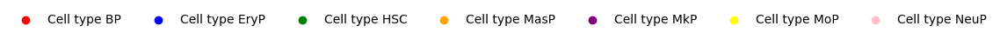

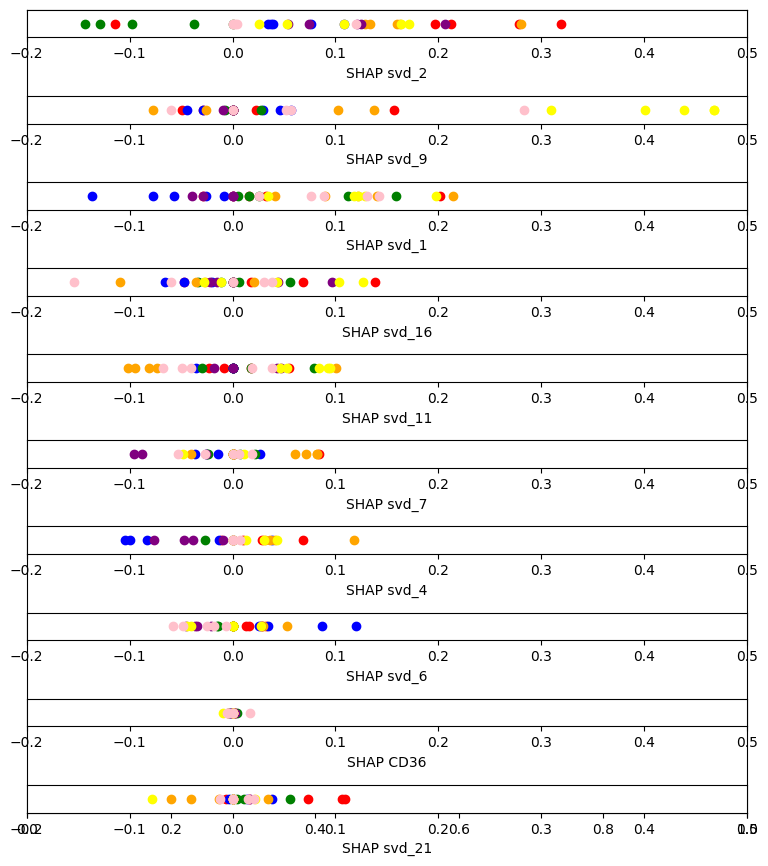

In [56]:
# Assign different colors to each class
colors = {'BP': 'red', 'EryP': 'blue', 'HSC': 'green', 'MasP': 'orange', 'MkP': 'purple', 'MoP': 'yellow', 'NeuP': 'pink'}

## legend ##
legend_fig, legend_ax = plt.subplots(figsize=(2, 2))

for class_label, color in colors.items():
    legend_ax.scatter([], [], color=color, label=f'Cell type {class_label}')

legend_ax.legend(loc='center', bbox_to_anchor=(0.5, 1.2), ncol=len(colors), frameon=False)
legend_ax.axis('off')
## legend ##


# plot shap values:
fig, ax = plt.subplots(figsize=(8, 10))

x_limit = (-0.2, 0.5)

# Remove y-axis ticks and labels
ax.yaxis.set_visible(False)

# Iterate over the columns in shap_cell_types to create subplots
for i, column in enumerate(shap_cell_types.columns[:-1], start=1):

    ax = fig.add_subplot(len(shap_cell_types.columns)-1, 1, i)

    # Set the x-axis limits and label
    ax.set_xlim(x_limit)
    ax.set_xlabel(column)

    ax.yaxis.set_visible(False)

    # Plot the dots for the current column
    for index, row in shap_cell_types.iterrows():
        shap_value = row[column]
        class_label = row['Cell Type']
        color = colors[class_label]
        ax.plot(shap_value, 0, marker='o', color=color)

        
fig.tight_layout(rect=[0, 0.1, 1, 1]) 
legend_fig.subplots_adjust(top=0.1, bottom=0.05)

plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


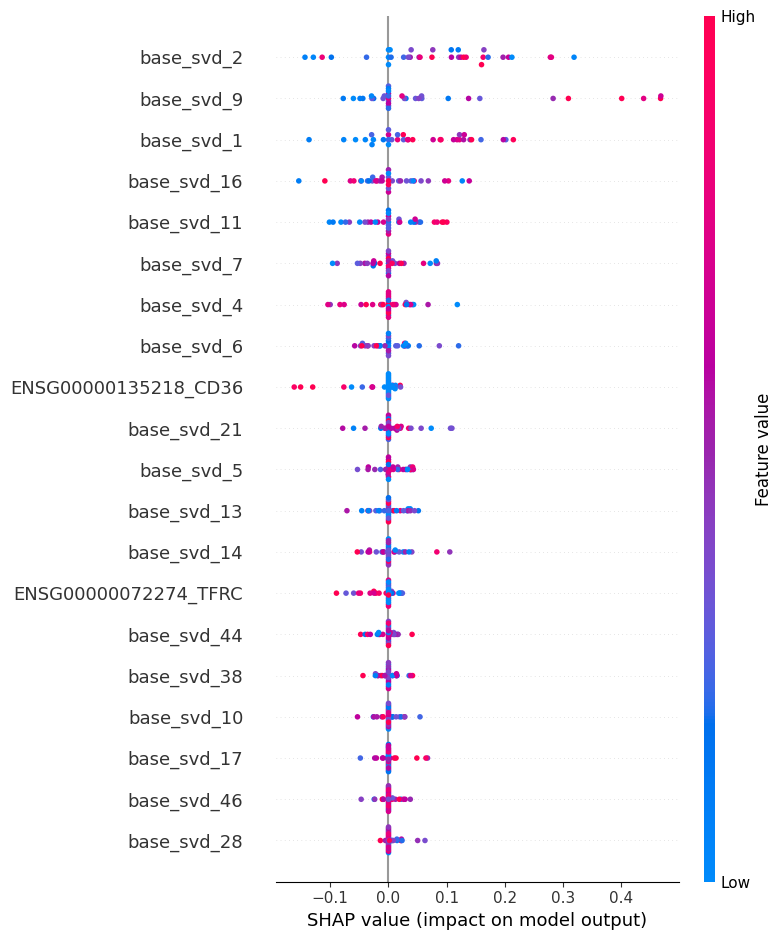

In [57]:
shap.initjs()
shap.summary_plot(shap_values[0], xtest.drop(['cell_id', 'cell_type'], axis=1), feature_names=xtest.drop(['cell_id', 'cell_type'], axis=1).columns)

# goal: get this plot as SHAP / features instead of SHAP / SVD components + features


Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


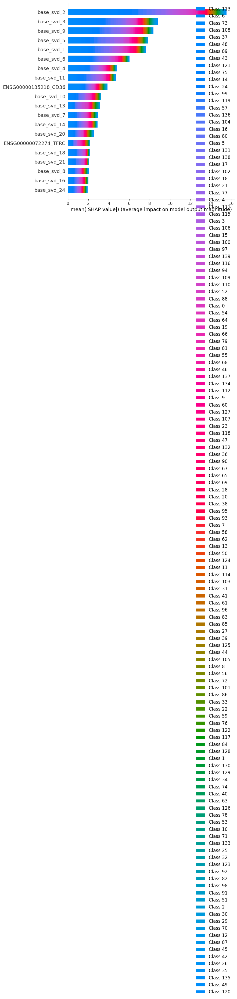

In [58]:
shap.initjs()
shap.summary_plot(list(shap_values), plot_type = 'bar', feature_names = xtest.drop(['cell_id', 'cell_type'], axis=1).columns)
# 140 classes = each regression output

In [59]:
shap.initjs()
shap.force_plot(explainer.expected_value[3], shap_values[3], feature_names = xtest.drop(['cell_id', 'cell_type'], axis=1).columns)

### svd contributions:

In [60]:
svd_comp_norm = np.loadtxt('/dss/dsshome1/02/di93zoj/valentina/open-problems-multimodal-3rd-solution/code/2.preprocess_to_feature/cite/svd_comp_norm.txt', delimiter=',')
pd.DataFrame(svd_comp_norm)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,21751,21752,21753,21754,21755,21756,21757,21758,21759,21760,21761,21762,21763,21764,21765,21766,21767,21768,21769,21770,21771,21772,21773,21774,21775,21776,21777,21778,21779,21780,21781,21782,21783,21784,21785,21786,21787,21788,21789,21790,21791,21792,21793,21794,21795,21796,21797,21798,21799,21800,21801,21802,21803,21804,21805,21806,21807,21808,21809,21810,21811,21812,21813,21814,21815,21816,21817,21818,21819,21820,21821,21822,21823,21824,21825,21826,21827,21828,21829,21830,21831,21832,21833,21834,21835,21836,21837,21838,21839,21840,21841,21842,21843,21844,21845,21846,21847,21848,21849,21850,21851,21852,21853,21854,21855,21856,21857,21858,21859,21860,21861,21862,21863,21864,21865,21866,21867,21868,21869,21870,21871,21872,21873,21874,21875,21876,21877,21878,21879,21880,21881,21882,21883,21884,21885,21886,21887,21888,21889,21890,21891,21892,21893,21894,21895,21896,21897,21898,21899,21900,21901,21902,21903,21904,21905,21906,21907,21908,21909,21910,21911,21912,21913,21914,21915,21916,21917,21918,21919,21920,21921,21922,21923,21924,21925,21926,21927,21928,21929,21930,21931,21932,21933,21934,21935,21936,21937,21938,21939,21940,21941,21942,21943,21944,21945,21946,21947,21948,21949,21950,21951,21952,21953,21954,21955,21956,21957,21958,21959,21960,21961,21962,21963,21964,21965,21966,21967,21968,21969,21970,21971,21972,21973,21974,21975,21976,21977,21978,21979,21980,21981,21982,21983,21984,21985,21986,21987,21988,21989,21990,21991,21992,21993,21994,21995,21996,21997,21998,21999,22000
0,2.639231e-06,0.000006,8.334996e-07,5.828498e-06,2.757570e-08,3.741900e-06,0.000061,0.000067,0.000008,0.000045,0.000100,0.000086,0.000112,1.561256e-07,0.000032,1.728947e-06,0.000082,0.000014,0.000025,0.000051,0.000135,0.000007,5.866902e-07,0.000140,0.000002,1.095948e-06,6.541856e-06,0.000001,3.544955e-07,4.230418e-06,0.000003,1.019473e-06,0.000044,0.000005,0.000019,5.263685e-08,0.000017,0.000010,0.000057,7.720353e-07,7.685959e-07,5.282250e-07,0.000066,0.000036,0.000008,0.000052,0.000009,1.422967e-07,4.234706e-07,0.000006,0.000094,0.000042,8.176887e-07,5.854452e-06,0.000071,0.000045,0.000189,0.000212,0.000078,0.000032,0.000007,0.000003,1.333464e-06,0.000002,0.000066,0.000034,5.748485e-07,0.000048,7.900942e-07,3.164364e-05,0.000093,4.836841e-06,0.000124,1.730864e-05,4.585917e-08,0.000004,0.000133,1.834919e-06,0.000053,0.000023,0.000039,0.000086,0.000035,0.000010,0.000058,0.000009,0.000018,0.000091,0.000081,8.403822e-06,7.510666e-08,0.000025,0.000036,0.000047,2.525333e-08,0.000027,0.000026,0.000335,0.000075,0.000059,0.000094,0.000017,2.498941e-06,1.825300e-07,1.482199e-06,2.720675e-08,7.202646e-07,1.025972e-07,1.216199e-07,2.298947e-06,0.000005,4.184617e-08,3.321497e-07,7.704764e-07,6.641036e-08,5.345493e-07,1.273985e-08,3.954054e-07,2.966712e-07,7.642673e-07,9.612144e-08,1.299063e-06,1.313163e-07,0.000001,5.110732e-06,8.755644e-08,0.000015,2.911845e-06,3.102028e-07,3.421804e-08,3.980902e-06,3.033018e-07,0.000002,0.000116,0.000001,0.000010,0.000020,0.000005,1.464340e-07,1.359576e-06,6.118285e-07,7.770907e-07,2.120756e-06,2.090130e-06,0.000003,0.000020,6.725611e-06,0.000011,0.00000

In [61]:
# base_svd_2 important feature
svd_comp_norm[2]         # => contribution x_2 = -0.00001809 * geneA - 0.00000149 * geneB + 0.0000030917 * geneC + ... + 0.0001264 geneX + 0.00026577 geneY + 0.000175 geneZ

array([-1.80979350e-05, -1.49000311e-06,  3.09174447e-06, ...,
        1.26464845e-04,  2.65770446e-04,  1.75062174e-04])

In [62]:
pd.DataFrame(shap_values[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211
0,-0.001258,-0.028997,0.196794,0.000000,0.000000,0.000000,0.028894,0.000963,-0.007535,-0.028404,-0.026043,0.054919,0.000000,0.000000,-0.002095,-0.006193,0.068443,0.000000,0.000000,0.000000,0.015090,-0.006373,-0.009335,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.017580,0.006380,0.000000,0.000000,0.026073,0.013710,0.000000,0.000000,0.000000,0.000000,-0.003678,0.000000,-0.006961,0.000000,0.015954,0.000000,0.000000,0.000000,0.014865,0.000000,-0.012759,0.000000,-0.024475,0.000000,0.009193,0.011366,0.000000,0.000000,0.010366,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.007844,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012524,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013778,0.000000,0.000000,0.000000,0.000000,0.000000,-0.006143,0.000000,0.000000,0.000000,0.000000,0.000482,0.000000,0.000000,0.014865,0.000000,0.000000,0.000000,0.000000,0.000000,-0.007963,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.003403,0.000000,0.000000,0.002785,0.000000,0.000000,0.000000,0.000000,-0.009870,0.001185,-0.007707,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.012483,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-0.005068,-0.009221,0.000000,0.000000,0.000000,-0.002215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.007157,0.000000,0.013662,0.000000,0.002915,0.000000,0.005182,0.000000,0.005495,0.000000,0.000000,-0.003199,0.000000,0.000000,-0.003241,-0.014645,0.000000,0.000000,-0.006761,0.000000,0.000000,-0.000781,0.000000,0.000000,0.000000,0.000000,0.000000,-0.001870,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.048217,0.000000,0.000000,0.000000
1,0.000000,0.032728,0.318743,0.008943,0.010122,-0.013775,0.012584,0.000000,0.000000,0.023219,-0.019991,-0.008505,-0.010018,0.031958,0.000000,0.000572,0.000000,-0.020723,0.000000,0.000000,-0.013073,0.015816,-0.010917,-0.009036,0.000000,0.000000,0.001178,0.000000,0.000000,-0.033049,0.000000,0.015324,0.000000,-0.020248,0.000000,0.000000,0.000000,0.000000,0.000000,0.015825,0.014286,0.000000,0.018556,0.000000,-0.014683,0.000000,0.000000,0.013365,0.000000,0.013166,0.000000,0.000000,0.000000,0.033506,0.000000,0.000000,0.000000,-0.010843,0.013713,-0.005361,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.023416,0.000000,0.000000,0.000000,0.000000,0.000000,-0.003874,0.000000,0.000000,0.015913,0.000000,0.000000,-0.028401,0.000000,0.000000,0.000000,0.000000,0.000000,-0.006859,0.000000,0.000000,-0.013873,0.000000,0.017522,0.000000,0.000000,0.001244,0.000000,0.000000,0.003024,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010486,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.012430,0.000000,0.000000,0.000000,0.000000,0.008684,0.000000,0.000000,-0.016597,0.010344,0.000000,0.000000,0.000000,0.000000,-0.012707,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0

In [63]:
# multiply SHAP(svd_n)*contribution of gene A to component n -> sum
# each dot in summary_plot is attribution for one cell -> loop over all cells

# 212 features: 128 svd and 84 genes
# cells: 35
# predicted "classes": 140

# contribution of gene A to component n: svd_comp_norm
# SHAP(svd_n) for the 128 svd (=first 128 columns)

attr_genes_only = np.zeros((len(xtest), 22001))  # Initialize the output array, 35x22001

for cell in range(len(xtest)):
    for gene in range(22001):
        attr_gene = 0
        for svd in range(128):
            attr_gene += shap_values[0][cell][svd] * svd_comp_norm[svd][gene]   # this is for one cell -> loop over all cells
        attr_genes_only[cell][gene] = attr_gene
attr_genes_only

array([[ 4.73217407e-06, -3.47333530e-05,  3.75817121e-04, ...,
         4.43387984e-04, -1.25020299e-03, -2.34682679e-04],
       [ 1.35400431e-04,  1.62810242e-04, -1.23668869e-04, ...,
         2.38082110e-04,  5.81653030e-04,  4.25412683e-04],
       [ 3.75104409e-05, -1.49274182e-05, -3.76728242e-06, ...,
         1.74768771e-04,  1.12188808e-03,  1.60043420e-04],
       ...,
       [ 5.16313019e-06,  4.06732603e-05, -1.07736344e-04, ...,
        -5.81096956e-05,  1.71550743e-03,  2.43950447e-04],
       [-1.31906763e-06,  8.46107765e-06,  2.79242547e-05, ...,
         3.49507205e-04, -3.97697592e-05, -1.89920492e-04],
       [ 3.99124051e-05,  1.47412259e-04, -3.82776402e-04, ...,
        -1.47731537e-04, -4.66664902e-03,  1.70772784e-05]])

In [64]:
# add third dimension -> 140x35x22001
attr_genes_only = np.zeros((shap_values.shape[0], len(xtest), 22001))  # Initialize the output array, 140x35x22001

for pred in range(shap_values.shape[0]):
    for cell in range(len(xtest)):
        attr_genes_only[pred, cell] = np.sum(shap_values[pred, cell, :128, None] * svd_comp_norm[:128], axis=0)

attr_genes_only

array([[[ 4.73217407e-06, -3.47333530e-05,  3.75817121e-04, ...,
          4.43387984e-04, -1.25020299e-03, -2.34682679e-04],
        [ 1.35400431e-04,  1.62810242e-04, -1.23668869e-04, ...,
          2.38082110e-04,  5.81653030e-04,  4.25412683e-04],
        [ 3.75104409e-05, -1.49274182e-05, -3.76728242e-06, ...,
          1.74768771e-04,  1.12188808e-03,  1.60043420e-04],
        ...,
        [ 5.16313019e-06,  4.06732603e-05, -1.07736344e-04, ...,
         -5.81096956e-05,  1.71550743e-03,  2.43950447e-04],
        [-1.31906763e-06,  8.46107765e-06,  2.79242547e-05, ...,
          3.49507205e-04, -3.97697592e-05, -1.89920492e-04],
        [ 3.99124051e-05,  1.47412259e-04, -3.82776402e-04, ...,
         -1.47731537e-04, -4.66664902e-03,  1.70772784e-05]],

       [[-1.61334340e-05, -8.49515628e-05,  5.71485570e-05, ...,
          2.32055861e-04, -1.25296259e-03, -5.51732537e-05],
        [ 6.87591519e-07,  9.27523779e-06, -6.00877222e-05, ...,
          2.67471343e-04, -1.46200225e

In [65]:
attr_genes_only[0]

array([[ 4.73217407e-06, -3.47333530e-05,  3.75817121e-04, ...,
         4.43387984e-04, -1.25020299e-03, -2.34682679e-04],
       [ 1.35400431e-04,  1.62810242e-04, -1.23668869e-04, ...,
         2.38082110e-04,  5.81653030e-04,  4.25412683e-04],
       [ 3.75104409e-05, -1.49274182e-05, -3.76728242e-06, ...,
         1.74768771e-04,  1.12188808e-03,  1.60043420e-04],
       ...,
       [ 5.16313019e-06,  4.06732603e-05, -1.07736344e-04, ...,
        -5.81096956e-05,  1.71550743e-03,  2.43950447e-04],
       [-1.31906763e-06,  8.46107765e-06,  2.79242547e-05, ...,
         3.49507205e-04, -3.97697592e-05, -1.89920492e-04],
       [ 3.99124051e-05,  1.47412259e-04, -3.82776402e-04, ...,
        -1.47731537e-04, -4.66664902e-03,  1.70772784e-05]])

In [66]:
all_genes = np.loadtxt('/dss/dsshome1/02/di93zoj/valentina/open-problems-multimodal-3rd-solution/code/2.preprocess_to_feature/cite/all_genes_names.txt', dtype=str)
all_genes   # len 22001   (excl. the 84 other genes)   -> need list(all_genes) + gene_ids

array(['ENSG00000121410_A1BG', 'ENSG00000268895_A1BG-AS1',
       'ENSG00000175899_A2M', ..., 'ENSG00000162378_ZYG11B',
       'ENSG00000159840_ZYX', 'ENSG00000074755_ZZEF1'], dtype='<U41')

In [67]:
attr_all_22085_genes = np.hstack((attr_genes_only[0], shap_values[0][:,-84:]))
pd.DataFrame(attr_all_22085_genes, columns=list(all_genes)+gene_ids)

,ENSG00000121410_A1BG,ENSG00000268895_A1BG-AS1,ENSG00000175899_A2M,ENSG00000245105_A2M-AS1,ENSG00000166535_A2ML1,ENSG00000128274_A4GALT,ENSG00000094914_AAAS,ENSG00000081760_AACS,ENSG00000109576_AADAT,ENSG00000103591_AAGAB,ENSG00000115977_AAK1,ENSG00000087884_AAMDC,ENSG00000127837_AAMP,ENSG00000129673_AANAT,ENSG00000131043_AAR2,ENSG00000205002_AARD,ENSG00000090861_AARS,ENSG00000124608_AARS2,ENSG00000266967_AARSD1,ENSG00000157426_AASDH,ENSG00000149313_AASDHPPT,ENSG00000008311_AASS,ENSG00000215458_AATBC,ENSG00000275700_AATF,ENSG00000181409_AATK,ENSG00000281376_ABALON,ENSG00000183044_ABAT,ENSG00000165029_ABCA1,ENSG00000154263_ABCA10,ENSG00000251595_ABCA11P,ENSG00000179869_ABCA13,ENSG00000238098_ABCA17P,ENSG00000107331_ABCA2,ENSG00000167972_ABCA3,ENSG00000154265_ABCA5,ENSG00000154262_ABCA6,ENSG00000064687_ABCA7,ENSG00000085563_ABCB1,ENSG00000135776_ABCB10,ENSG00000073734_ABCB11,ENSG00000005471_ABCB4,ENSG00000115657_ABCB6,ENSG00000131269_ABCB7,ENSG00000197150_ABCB8,ENSG00000150967_ABCB9,ENSG00000103222_ABCC1,ENSG00000124574_ABCC10,ENSG00000243064_ABCC13,ENSG00000023839_ABCC2,ENSG00000108846_ABCC3,ENSG00000125257_ABCC4,ENSG00000114770_ABCC5,ENSG00000091262_ABCC6,ENSG00000101986_ABCD1,ENSG00000117528_ABCD3,ENSG00000119688_ABCD4,ENSG00000164163_ABCE1,ENSG00000204574_ABCF1,ENSG00000033050_ABCF2,ENSG00000161204_ABCF3,ENSG00000160179_ABCG1,ENSG00000118777_ABCG2,ENSG00000143921_ABCG8,ENSG00000143994_ABHD1,ENSG00000144827_ABHD10,ENSG00000106077_ABHD11,ENSG00000225969_ABHD11-AS1,ENSG00000100997_ABHD12,ENSG00000131969_ABHD12B,ENSG00000139826_ABHD13,ENSG00000248487_ABHD14A,ENSG00000114786_ABHD14A-ACY1,ENSG00000114779_ABHD14B,ENSG00000168792_ABHD15,ENSG00000264031_ABHD15-AS1,ENSG00000204427_ABHD16A,ENSG00000129968_ABHD17A,ENSG00000250536_ABHD17AP3,ENSG00000107362_ABHD17B,ENSG00000136379_ABHD17C,ENSG00000164074_ABHD18,ENSG00000140526_ABHD2,ENSG00000158201_ABHD3,ENSG00000100439_ABHD4,ENSG00000011198_ABHD5,ENSG00000163686_ABHD6,ENSG00000127220_ABHD8,ENSG00000136754_ABI1,ENSG00000138443_ABI2,ENSG00000108798_ABI3,ENSG00000154175_ABI3BP,ENSG00000097007_ABL1,ENSG00000143322_ABL2,ENSG00000099204_ABLIM1,ENSG00000173210_ABLIM3,ENSG00000175164_ABO,ENSG00000159842_ABR,ENSG00000146386_ABRACL,ENSG00000163322_ABRAXAS1,ENSG00000165660_ABRAXAS2,ENSG00000146109_ABT1,ENSG00000114626_ABTB1,ENSG00000166016_ABTB2,ENSG00000260246_AC000032.1,ENSG00000185065_AC000068.1,ENSG00000273212_AC000068.2,ENSG00000273300_AC000068.3,ENSG00000235776_AC000089.1,ENSG00000243107_AC000120.1,ENSG00000279265_AC000123.2,ENSG00000280347_AC000123.3,ENSG00000278727_AC000403.1,ENSG00000274898_AC001226.1,ENSG00000283208_AC001226.2,ENSG00000272330_AC002044.1,ENSG00000279591_AC002044.2,ENSG00000213683_AC002056.1,ENSG00000273216_AC002059.1,ENSG00000248636_AC002070.1,ENSG00000237729_AC002075.2,ENSG00000265975_AC002091.1,ENSG00000266389_AC002091.2,ENSG00000265618_AC002094.2,ENSG00000277450_AC002094.4,ENSG00000267698_AC002116.2,ENSG00000268947_AC002128.1,ENSG00000235560_AC002310.1,ENSG00000239791_AC002310.2,ENSG00000278922_AC002310.6,ENSG00000261433_AC002347.1,ENSG00000278993_AC002350.1,ENSG00000232392_AC002366.1,ENSG00000283638_AC002407.1,ENSG00000237819_AC002454.1,ENSG00000223969_AC002456.1,ENSG00000260188_AC002464.1,ENSG00000241764_AC002467.1,ENSG00000272829_AC002470.1,ENSG00000284060_AC002472.2,ENSG00000235945_AC002543.1,ENSG00000261312_AC002550.1,ENSG00000276571_AC002550.2,ENSG00000227782_AC002553.1,ENSG00000275413_AC002553.2,ENSG00000239291_AC002558.1,ENSG00000262265_AC002558.3,ENSG00000260793_AC003102.1,ENSG00000279159_AC003681.1,ENSG00000263280_AC003965.1,ENSG00000279377_AC003973.3,ENSG00000228113_AC003991.1,ENSG00000254003_AC003991.2,ENSG00000237903_AC004000.1,ENSG00000262482_AC004034.1,ENSG00000196656_AC004057.1,ENSG00000273447_AC004067.1,ENSG00000251259_AC004069.1,ENSG00000276449_AC004076.2,ENSG00000270182_AC004080.4,ENSG00000271133_AC004130.1,ENSG00000263272_AC004148.2,ENSG00000267666_AC004156.1,ENSG00000260664_AC004158.1,ENSG00000267457_AC004223.2,ENSG00000273687_AC004223.3,ENSG0000026

In [68]:
test_inputs = scipy.sparse.load_npz(index_path + "test_cite_raw_inputs_values.sparse.npz")
test_inputs = pd.DataFrame(test_inputs.toarray(), columns=list(all_genes)+gene_ids)

# get cell ids
test_ids = np.load(index_path + "test_cite_raw_inputs_idxcol.npz", allow_pickle=True)
test_index = test_ids["index"]
len(test_index)

test_inputs.index = test_index

test_inputs

,ENSG00000121410_A1BG,ENSG00000268895_A1BG-AS1,ENSG00000175899_A2M,ENSG00000245105_A2M-AS1,ENSG00000166535_A2ML1,ENSG00000128274_A4GALT,ENSG00000094914_AAAS,ENSG00000081760_AACS,ENSG00000109576_AADAT,ENSG00000103591_AAGAB,ENSG00000115977_AAK1,ENSG00000087884_AAMDC,ENSG00000127837_AAMP,ENSG00000129673_AANAT,ENSG00000131043_AAR2,ENSG00000205002_AARD,ENSG00000090861_AARS,ENSG00000124608_AARS2,ENSG00000266967_AARSD1,ENSG00000157426_AASDH,ENSG00000149313_AASDHPPT,ENSG00000008311_AASS,ENSG00000215458_AATBC,ENSG00000275700_AATF,ENSG00000181409_AATK,ENSG00000281376_ABALON,ENSG00000183044_ABAT,ENSG00000165029_ABCA1,ENSG00000154263_ABCA10,ENSG00000251595_ABCA11P,ENSG00000179869_ABCA13,ENSG00000238098_ABCA17P,ENSG00000107331_ABCA2,ENSG00000167972_ABCA3,ENSG00000154265_ABCA5,ENSG00000154262_ABCA6,ENSG00000064687_ABCA7,ENSG00000085563_ABCB1,ENSG00000135776_ABCB10,ENSG00000073734_ABCB11,ENSG00000005471_ABCB4,ENSG00000115657_ABCB6,ENSG00000131269_ABCB7,ENSG00000197150_ABCB8,ENSG00000150967_ABCB9,ENSG00000103222_ABCC1,ENSG00000124574_ABCC10,ENSG00000243064_ABCC13,ENSG00000023839_ABCC2,ENSG00000108846_ABCC3,ENSG00000125257_ABCC4,ENSG00000114770_ABCC5,ENSG00000091262_ABCC6,ENSG00000101986_ABCD1,ENSG00000117528_ABCD3,ENSG00000119688_ABCD4,ENSG00000164163_ABCE1,ENSG00000204574_ABCF1,ENSG00000033050_ABCF2,ENSG00000161204_ABCF3,ENSG00000160179_ABCG1,ENSG00000118777_ABCG2,ENSG00000143921_ABCG8,ENSG00000143994_ABHD1,ENSG00000144827_ABHD10,ENSG00000106077_ABHD11,ENSG00000225969_ABHD11-AS1,ENSG00000100997_ABHD12,ENSG00000131969_ABHD12B,ENSG00000139826_ABHD13,ENSG00000248487_ABHD14A,ENSG00000114786_ABHD14A-ACY1,ENSG00000114779_ABHD14B,ENSG00000168792_ABHD15,ENSG00000264031_ABHD15-AS1,ENSG00000204427_ABHD16A,ENSG00000129968_ABHD17A,ENSG00000250536_ABHD17AP3,ENSG00000107362_ABHD17B,ENSG00000136379_ABHD17C,ENSG00000164074_ABHD18,ENSG00000140526_ABHD2,ENSG00000158201_ABHD3,ENSG00000100439_ABHD4,ENSG00000011198_ABHD5,ENSG00000163686_ABHD6,ENSG00000127220_ABHD8,ENSG00000136754_ABI1,ENSG00000138443_ABI2,ENSG00000108798_ABI3,ENSG00000154175_ABI3BP,ENSG00000097007_ABL1,ENSG00000143322_ABL2,ENSG00000099204_ABLIM1,ENSG00000173210_ABLIM3,ENSG00000175164_ABO,ENSG00000159842_ABR,ENSG00000146386_ABRACL,ENSG00000163322_ABRAXAS1,ENSG00000165660_ABRAXAS2,ENSG00000146109_ABT1,ENSG00000114626_ABTB1,ENSG00000166016_ABTB2,ENSG00000260246_AC000032.1,ENSG00000185065_AC000068.1,ENSG00000273212_AC000068.2,ENSG00000273300_AC000068.3,ENSG00000235776_AC000089.1,ENSG00000243107_AC000120.1,ENSG00000279265_AC000123.2,ENSG00000280347_AC000123.3,ENSG00000278727_AC000403.1,ENSG00000274898_AC001226.1,ENSG00000283208_AC001226.2,ENSG00000272330_AC002044.1,ENSG00000279591_AC002044.2,ENSG00000213683_AC002056.1,ENSG00000273216_AC002059.1,ENSG00000248636_AC002070.1,ENSG00000237729_AC002075.2,ENSG00000265975_AC002091.1,ENSG00000266389_AC002091.2,ENSG00000265618_AC002094.2,ENSG00000277450_AC002094.4,ENSG00000267698_AC002116.2,ENSG00000268947_AC002128.1,ENSG00000235560_AC002310.1,ENSG00000239791_AC002310.2,ENSG00000278922_AC002310.6,ENSG00000261433_AC002347.1,ENSG00000278993_AC002350.1,ENSG00000232392_AC002366.1,ENSG00000283638_AC002407.1,ENSG00000237819_AC002454.1,ENSG00000223969_AC002456.1,ENSG00000260188_AC002464.1,ENSG00000241764_AC002467.1,ENSG00000272829_AC002470.1,ENSG00000284060_AC002472.2,ENSG00000235945_AC002543.1,ENSG00000261312_AC002550.1,ENSG00000276571_AC002550.2,ENSG00000227782_AC002553.1,ENSG00000275413_AC002553.2,ENSG00000239291_AC002558.1,ENSG00000262265_AC002558.3,ENSG00000260793_AC003102.1,ENSG00000279159_AC003681.1,ENSG00000263280_AC003965.1,ENSG00000279377_AC003973.3,ENSG00000228113_AC003991.1,ENSG00000254003_AC003991.2,ENSG00000237903_AC004000.1,ENSG00000262482_AC004034.1,ENSG00000196656_AC004057.1,ENSG00000273447_AC004067.1,ENSG00000251259_AC004069.1,ENSG00000276449_AC004076.2,ENSG00000270182_AC004080.4,ENSG00000271133_AC004130.1,ENSG00000263272_AC004148.2,ENSG00000267666_AC004156.1,ENSG00000260664_AC004158.1,ENSG00000267457_AC004223.2,ENSG00000273687_AC004223.3,ENSG0000026

In [69]:
# cell ids used in xtest and SHAP:
sample_cells = np.array(xtest['cell_id'])
sample_cells

array(['d443b74b8869', '688ee518c0e8', 'e1d033612d09', 'c65c736927f5',
       '978653a10ed5', '609f3a5f1d29', 'b4811d076be8', '13b61b06571d',
       '2ec71b017b1e', '763c332f6116', 'a0a9af7f0c08', 'accb9f8a2b76',
       'b7ef83cab6bb', '32760ba13f43', '3b24dc46c8dd', 'e595a9579a1d',
       '3c3687cbf1be', '27bf59e53a07', 'd5aee7f3c3fe', 'df3ed7c0d68f',
       '84e362827d3e', 'bfb50e9fcf4d', 'd1b79147e5e5', 'a960d0223afc',
       '6f0091b39af6', '1582e62f3ac2', '9b399c938b7c', '86757df34a90',
       '1fd5ca159bd2', '7eb023999458', '3a14b8b66406', '3f2e176ad5bd',
       '7a3d027fc859', 'ba3944dec208', 'c1a0dcb79ba8'], dtype=object)

In [70]:
xtest_all_genes = test_inputs.loc[sample_cells]
xtest_all_genes

,ENSG00000121410_A1BG,ENSG00000268895_A1BG-AS1,ENSG00000175899_A2M,ENSG00000245105_A2M-AS1,ENSG00000166535_A2ML1,ENSG00000128274_A4GALT,ENSG00000094914_AAAS,ENSG00000081760_AACS,ENSG00000109576_AADAT,ENSG00000103591_AAGAB,ENSG00000115977_AAK1,ENSG00000087884_AAMDC,ENSG00000127837_AAMP,ENSG00000129673_AANAT,ENSG00000131043_AAR2,ENSG00000205002_AARD,ENSG00000090861_AARS,ENSG00000124608_AARS2,ENSG00000266967_AARSD1,ENSG00000157426_AASDH,ENSG00000149313_AASDHPPT,ENSG00000008311_AASS,ENSG00000215458_AATBC,ENSG00000275700_AATF,ENSG00000181409_AATK,ENSG00000281376_ABALON,ENSG00000183044_ABAT,ENSG00000165029_ABCA1,ENSG00000154263_ABCA10,ENSG00000251595_ABCA11P,ENSG00000179869_ABCA13,ENSG00000238098_ABCA17P,ENSG00000107331_ABCA2,ENSG00000167972_ABCA3,ENSG00000154265_ABCA5,ENSG00000154262_ABCA6,ENSG00000064687_ABCA7,ENSG00000085563_ABCB1,ENSG00000135776_ABCB10,ENSG00000073734_ABCB11,ENSG00000005471_ABCB4,ENSG00000115657_ABCB6,ENSG00000131269_ABCB7,ENSG00000197150_ABCB8,ENSG00000150967_ABCB9,ENSG00000103222_ABCC1,ENSG00000124574_ABCC10,ENSG00000243064_ABCC13,ENSG00000023839_ABCC2,ENSG00000108846_ABCC3,ENSG00000125257_ABCC4,ENSG00000114770_ABCC5,ENSG00000091262_ABCC6,ENSG00000101986_ABCD1,ENSG00000117528_ABCD3,ENSG00000119688_ABCD4,ENSG00000164163_ABCE1,ENSG00000204574_ABCF1,ENSG00000033050_ABCF2,ENSG00000161204_ABCF3,ENSG00000160179_ABCG1,ENSG00000118777_ABCG2,ENSG00000143921_ABCG8,ENSG00000143994_ABHD1,ENSG00000144827_ABHD10,ENSG00000106077_ABHD11,ENSG00000225969_ABHD11-AS1,ENSG00000100997_ABHD12,ENSG00000131969_ABHD12B,ENSG00000139826_ABHD13,ENSG00000248487_ABHD14A,ENSG00000114786_ABHD14A-ACY1,ENSG00000114779_ABHD14B,ENSG00000168792_ABHD15,ENSG00000264031_ABHD15-AS1,ENSG00000204427_ABHD16A,ENSG00000129968_ABHD17A,ENSG00000250536_ABHD17AP3,ENSG00000107362_ABHD17B,ENSG00000136379_ABHD17C,ENSG00000164074_ABHD18,ENSG00000140526_ABHD2,ENSG00000158201_ABHD3,ENSG00000100439_ABHD4,ENSG00000011198_ABHD5,ENSG00000163686_ABHD6,ENSG00000127220_ABHD8,ENSG00000136754_ABI1,ENSG00000138443_ABI2,ENSG00000108798_ABI3,ENSG00000154175_ABI3BP,ENSG00000097007_ABL1,ENSG00000143322_ABL2,ENSG00000099204_ABLIM1,ENSG00000173210_ABLIM3,ENSG00000175164_ABO,ENSG00000159842_ABR,ENSG00000146386_ABRACL,ENSG00000163322_ABRAXAS1,ENSG00000165660_ABRAXAS2,ENSG00000146109_ABT1,ENSG00000114626_ABTB1,ENSG00000166016_ABTB2,ENSG00000260246_AC000032.1,ENSG00000185065_AC000068.1,ENSG00000273212_AC000068.2,ENSG00000273300_AC000068.3,ENSG00000235776_AC000089.1,ENSG00000243107_AC000120.1,ENSG00000279265_AC000123.2,ENSG00000280347_AC000123.3,ENSG00000278727_AC000403.1,ENSG00000274898_AC001226.1,ENSG00000283208_AC001226.2,ENSG00000272330_AC002044.1,ENSG00000279591_AC002044.2,ENSG00000213683_AC002056.1,ENSG00000273216_AC002059.1,ENSG00000248636_AC002070.1,ENSG00000237729_AC002075.2,ENSG00000265975_AC002091.1,ENSG00000266389_AC002091.2,ENSG00000265618_AC002094.2,ENSG00000277450_AC002094.4,ENSG00000267698_AC002116.2,ENSG00000268947_AC002128.1,ENSG00000235560_AC002310.1,ENSG00000239791_AC002310.2,ENSG00000278922_AC002310.6,ENSG00000261433_AC002347.1,ENSG00000278993_AC002350.1,ENSG00000232392_AC002366.1,ENSG00000283638_AC002407.1,ENSG00000237819_AC002454.1,ENSG00000223969_AC002456.1,ENSG00000260188_AC002464.1,ENSG00000241764_AC002467.1,ENSG00000272829_AC002470.1,ENSG00000284060_AC002472.2,ENSG00000235945_AC002543.1,ENSG00000261312_AC002550.1,ENSG00000276571_AC002550.2,ENSG00000227782_AC002553.1,ENSG00000275413_AC002553.2,ENSG00000239291_AC002558.1,ENSG00000262265_AC002558.3,ENSG00000260793_AC003102.1,ENSG00000279159_AC003681.1,ENSG00000263280_AC003965.1,ENSG00000279377_AC003973.3,ENSG00000228113_AC003991.1,ENSG00000254003_AC003991.2,ENSG00000237903_AC004000.1,ENSG00000262482_AC004034.1,ENSG00000196656_AC004057.1,ENSG00000273447_AC004067.1,ENSG00000251259_AC004069.1,ENSG00000276449_AC004076.2,ENSG00000270182_AC004080.4,ENSG00000271133_AC004130.1,ENSG00000263272_AC004148.2,ENSG00000267666_AC004156.1,ENSG00000260664_AC004158.1,ENSG00000267457_AC004223.2,ENSG00000273687_AC004223.3,ENSG0000026

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


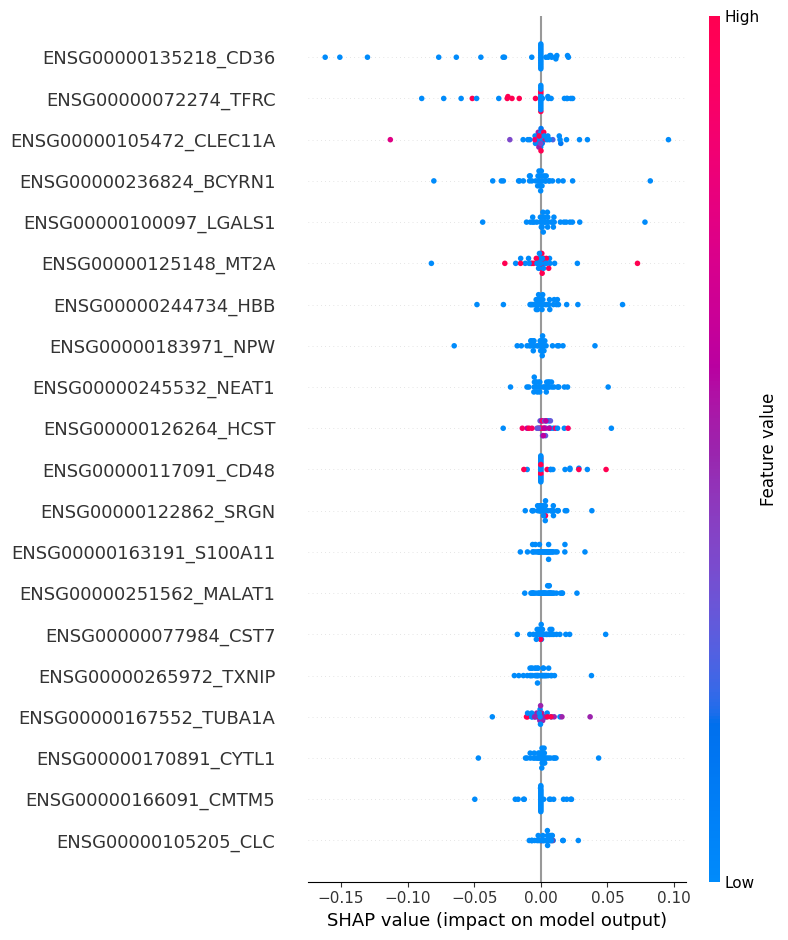

In [71]:
shap.initjs()
shap.summary_plot(attr_all_22085_genes, xtest_all_genes, feature_names=xtest_all_genes.columns)

In [72]:
# top 20 genes:
shap_sum = np.abs(attr_all_22085_genes).sum(axis=0)
top_features_indices = np.argsort(shap_sum)[::-1][:20]  # Get the indices of the top 20 features
top_feature_names_shap = xtest_all_genes.columns[top_features_indices]
top_feature_names_shap

Index(['ENSG00000135218_CD36', 'ENSG00000072274_TFRC',
       'ENSG00000105472_CLEC11A', 'ENSG00000236824_BCYRN1',
       'ENSG00000100097_LGALS1', 'ENSG00000125148_MT2A', 'ENSG00000244734_HBB',
       'ENSG00000183971_NPW', 'ENSG00000245532_NEAT1', 'ENSG00000126264_HCST',
       'ENSG00000117091_CD48', 'ENSG00000122862_SRGN',
       'ENSG00000163191_S100A11', 'ENSG00000251562_MALAT1',
       'ENSG00000077984_CST7', 'ENSG00000265972_TXNIP',
       'ENSG00000167552_TUBA1A', 'ENSG00000170891_CYTL1',
       'ENSG00000166091_CMTM5', 'ENSG00000105205_CLC'],
      dtype='object')

In [73]:
for gene in top_feature_names_shap:
    if gene in list(all_genes):
        print(gene, 'among 22001 genes.')
    if gene in gene_ids:
        print(gene, 'among handselected 84 genes.')

ENSG00000135218_CD36 among handselected 84 genes.
ENSG00000072274_TFRC among handselected 84 genes.
ENSG00000105472_CLEC11A among 22001 genes.
ENSG00000236824_BCYRN1 among 22001 genes.
ENSG00000100097_LGALS1 among 22001 genes.
ENSG00000125148_MT2A among 22001 genes.
ENSG00000244734_HBB among 22001 genes.
ENSG00000183971_NPW among 22001 genes.
ENSG00000245532_NEAT1 among 22001 genes.
ENSG00000126264_HCST among 22001 genes.
ENSG00000117091_CD48 among handselected 84 genes.
ENSG00000122862_SRGN among 22001 genes.
ENSG00000163191_S100A11 among 22001 genes.
ENSG00000251562_MALAT1 among 22001 genes.
ENSG00000077984_CST7 among 22001 genes.
ENSG00000265972_TXNIP among 22001 genes.
ENSG00000167552_TUBA1A among 22001 genes.
ENSG00000170891_CYTL1 among 22001 genes.
ENSG00000166091_CMTM5 among handselected 84 genes.
ENSG00000105205_CLC among 22001 genes.


### analyze gene attribution distributions

In [74]:
abs_mean_attributions = np.mean(np.abs(attr_all_22085_genes), axis=0)

distribution = np.histogram(abs_mean_attributions, bins=10)

print("Distribution of absolute values of mean attributions per gene for all genes:")
for value, count in zip(distribution[1], distribution[0]):
    print("Range: {:.5f} - {:.5f}, Count: {}".format(value, value + distribution[1][1], count))

Distribution of absolute values of mean attributions per gene for all genes:
Range: 0.00000 - 0.00228, Count: 21230
Range: 0.00228 - 0.00456, Count: 794
Range: 0.00456 - 0.00684, Count: 49
Range: 0.00684 - 0.00912, Count: 5
Range: 0.00912 - 0.01140, Count: 3
Range: 0.01140 - 0.01368, Count: 2
Range: 0.01368 - 0.01596, Count: 0
Range: 0.01596 - 0.01823, Count: 1
Range: 0.01823 - 0.02051, Count: 0
Range: 0.02051 - 0.02279, Count: 1


In [75]:
abs_mean_attributions_others = np.mean(np.abs(attr_all_22085_genes[:, :22001]), axis=0)

# log_bins = np.logspace(np.log2(abs_mean_attributions.min() + 1e-9), np.log2(abs_mean_attributions.max()), 10)  # for plot 

distribution_others = np.histogram(abs_mean_attributions_others, bins=distribution[1])  # bins=log_bins  # 10

print("Distribution of absolute values of mean attributions per column of 22001 genes:")
for value, count in zip(distribution_others[1], distribution_others[0]):
    print("Range: {:.5f} - {:.5f}, Count: {}".format(value, value + distribution_others[1][1], count))

# get top attributing genes
genes_higher_attr_others_idx = np.where(abs_mean_attributions_others >= 0.00766)[0]
print(genes_higher_attr_others_idx)
genes_higher_attr_others = all_genes[genes_higher_attr_others_idx]
genes_higher_attr_others

Distribution of absolute values of mean attributions per column of 22001 genes:
Range: 0.00000 - 0.00228, Count: 21185
Range: 0.00228 - 0.00456, Count: 764
Range: 0.00456 - 0.00684, Count: 43
Range: 0.00684 - 0.00912, Count: 4
Range: 0.00912 - 0.01140, Count: 3
Range: 0.01140 - 0.01368, Count: 2
Range: 0.01368 - 0.01596, Count: 0
Range: 0.01596 - 0.01823, Count: 0
Range: 0.01823 - 0.02051, Count: 0
Range: 0.02051 - 0.02279, Count: 0
[ 5759  7177 10314 11796 13369 13816 14101]


array(['ENSG00000236824_BCYRN1', 'ENSG00000105472_CLEC11A',
       'ENSG00000244734_HBB', 'ENSG00000100097_LGALS1',
       'ENSG00000125148_MT2A', 'ENSG00000245532_NEAT1',
       'ENSG00000183971_NPW'], dtype='<U41')

In [76]:
abs_mean_attributions_handselected = np.mean(np.abs(attr_all_22085_genes[:, -84:]), axis=0)

# log_bins = np.logspace(np.log2(abs_mean_attributions.min() + 1e-9), np.log2(abs_mean_attributions.max()), 10)

distribution_handselected = np.histogram(abs_mean_attributions_handselected, bins=10)  # bins=log_bins

print("Distribution of absolute values of mean attributions per handselected gene:")
for value, count in zip(distribution_handselected[1], distribution_handselected[0]):
    print("Range: {:.5f} - {:.5f}, Count: {}".format(value, value + distribution_handselected[1][1], count))

# get genes with count 1 (top attributing genes)
genes_higher_attr_handselected_idx = np.where(abs_mean_attributions_handselected >= 0.00684)[0]
print(genes_higher_attr_handselected_idx)
genes_higher_attr_handselected = [gene_ids[idx] for idx in genes_higher_attr_handselected_idx]
genes_higher_attr_handselected

Distribution of absolute values of mean attributions per handselected gene:
Range: 0.00000 - 0.00228, Count: 45
Range: 0.00228 - 0.00456, Count: 30
Range: 0.00456 - 0.00684, Count: 6
Range: 0.00684 - 0.00912, Count: 1
Range: 0.00912 - 0.01140, Count: 0
Range: 0.01140 - 0.01368, Count: 0
Range: 0.01368 - 0.01596, Count: 0
Range: 0.01596 - 0.01823, Count: 1
Range: 0.01823 - 0.02051, Count: 0
Range: 0.02051 - 0.02279, Count: 1
[20 24 80]


['ENSG00000135218_CD36', 'ENSG00000117091_CD48', 'ENSG00000072274_TFRC']

In [77]:
print(abs_mean_attributions_handselected.tolist().index(0))
gene_ids[14]

14


'ENSG00000206531_CD200R1L'

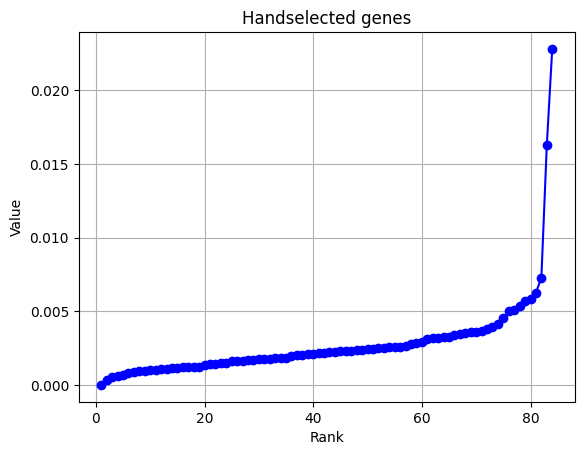

In [78]:
values = np.sort(abs_mean_attributions_handselected)
ranks = np.arange(1, len(values) + 1)

plt.plot(ranks, values, marker='o', linestyle='-', color='blue')
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('Handselected genes')
plt.grid(True)
plt.show()

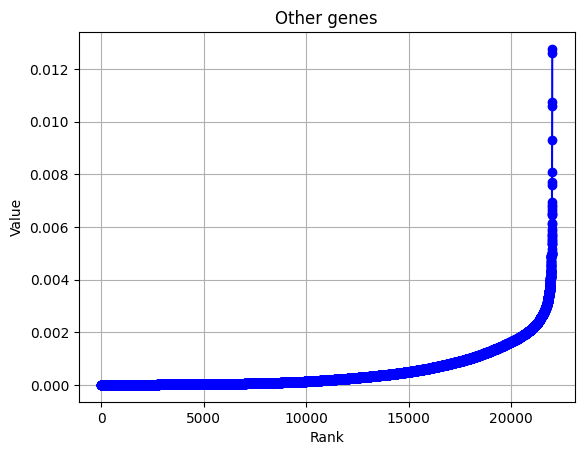

In [79]:
values = np.sort(abs_mean_attributions_others)
ranks = np.arange(1, len(values) + 1)

plt.plot(ranks, values, marker='o', linestyle='-', color='blue')
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('Other genes')
plt.grid(True)
plt.show()

In [80]:
# TODO plot these in one plot: seaborn scatterplot hue

In [81]:
# get abs_mean_attribution == 0
#print(np.sort(abs_mean_attributions_handselected))
#print(np.sort(abs_mean_attributions_others)[:500])

In [82]:
for i in genes_higher_attr_others:
    print(i in top_feature_names_shap)

for i in genes_higher_attr_handselected:
    print(i in top_feature_names_shap)

True
True
True
True
True
True
True
True
True
True


In [83]:
# TODO add label of gini index per plot
def gini(arr):    # range from 0 (total equality) to 1 (absolute inequality)
    ## first sort
    sorted_arr = arr.copy()
    sorted_arr.sort()
    n = arr.size
    coef_ = 2. / n
    const_ = (n + 1.) / n
    weighted_sum = sum([(i+1)*yi for i, yi in enumerate(sorted_arr)])
    return coef_*weighted_sum/(sorted_arr.sum()) - const_

print(gini(abs_mean_attributions_handselected))
print(gini(abs_mean_attributions_others))


# TODO put plots into one with same y-axis scale

0.3988689912906416
0.660323323362501


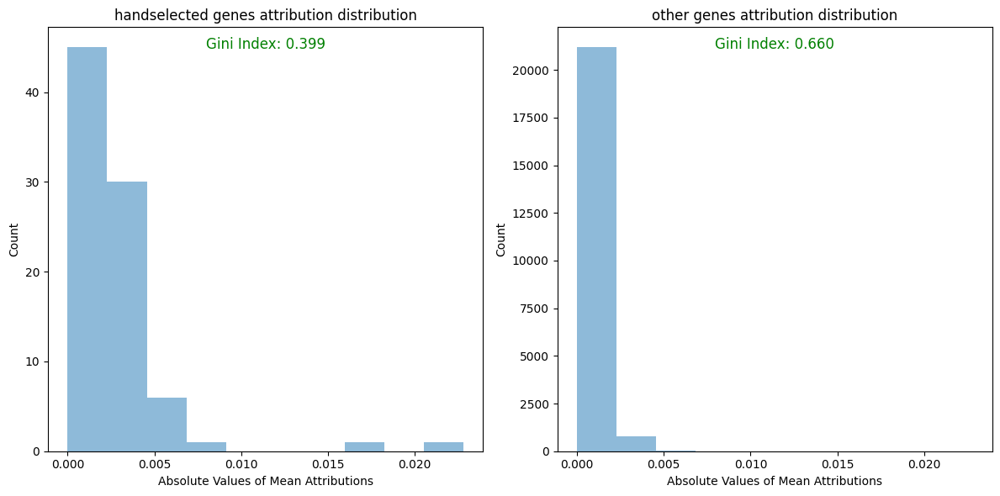

In [84]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.hist(abs_mean_attributions_handselected, bins=distribution[1], alpha=0.5)  # bins=distribution[1]  # bins=log_bins
# ax1.set_xscale('log')
ax1.text(0.5, 0.95, f'Gini Index: {gini(abs_mean_attributions_handselected):.3f}', transform=ax1.transAxes, ha='center', color='green', fontsize=12)

ax1.set_xlabel('Absolute Values of Mean Attributions')
ax1.set_ylabel('Count')
ax1.set_title('handselected genes attribution distribution')

ax2.hist(abs_mean_attributions_others, bins=distribution[1], alpha=0.5)
# ax2.set_xscale('log')
ax2.text(0.5, 0.95, f'Gini Index: {gini(abs_mean_attributions_others):.3f}', transform=ax2.transAxes, ha='center', color='green', fontsize=12)

ax2.set_xlabel('Absolute Values of Mean Attributions')
ax2.set_ylabel('Count')
ax2.set_title('other genes attribution distribution')

plt.tight_layout()
plt.show()

(0.0, 22244.25)


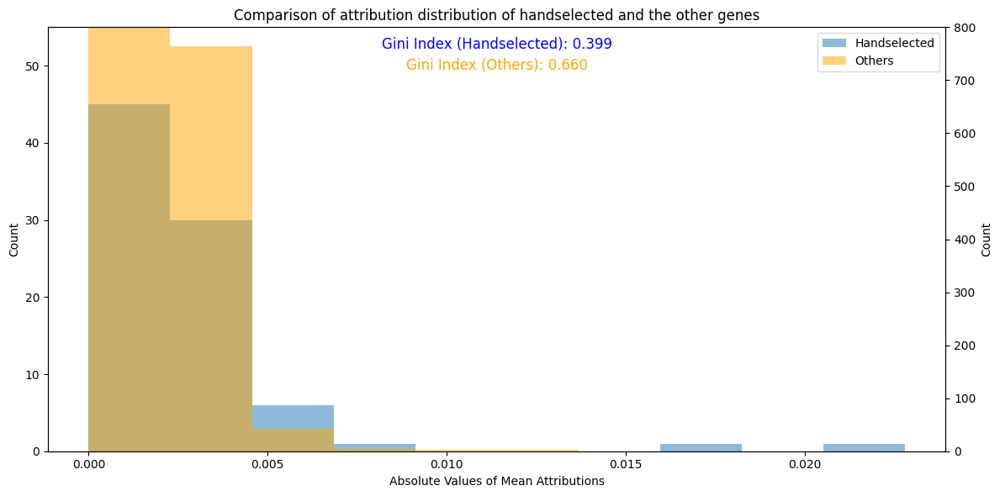

In [88]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.hist(abs_mean_attributions_handselected, bins=distribution[1], alpha=0.5, label='Handselected')
ax.set_xlabel('Absolute Values of Mean Attributions')
ax.set_ylabel('Count')
ax.set_title('Comparison of attribution distribution of handselected and the other genes')

# Create a twin axis for the second histogram
ax2 = ax.twinx()

ax2.hist(abs_mean_attributions_others, bins=distribution[1], alpha=0.5, color='orange', label='Others')
ax2.set_ylabel('Count')

# Adjust the y-axis limits of the twin Axes to match the primary Axes
# ax.set_ylim(ax2.get_ylim())
print(ax2.get_ylim())
ax.set_ylim((0,55))
ax2.set_ylim((0,800))

# Add legend
handles, labels = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles + handles2, labels + labels2, loc='upper right')

# Add Gini index labels
ax.text(0.5, 0.95, f'Gini Index (Handselected): {gini(abs_mean_attributions_handselected):.3f}', transform=ax.transAxes, ha='center', color='blue', fontsize=12)
ax2.text(0.5, 0.90, f'Gini Index (Others): {gini(abs_mean_attributions_others):.3f}', transform=ax2.transAxes, ha='center', color='orange', fontsize=12)

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

In [89]:
# TODO same density for both plots (same area of histograms) -> adjusts y-axes

In [90]:
# analyze svd components distr.

mean_svd_contr = np.mean(np.abs(svd_comp_norm), axis=0)
top_20_indices = np.argsort(mean_svd_contr)[-20:][::-1]

top_20_mean_contributions = mean_svd_contr[top_20_indices]
top_features_svd = []

# Print the top 20 columns and their mean contributionsb
print("Top 20 Columns with Highest Mean Contributions to SVDs:")
for column_index, mean_contribution in zip(top_20_indices, top_20_mean_contributions):
    print("Column: {}, Mean Contribution: {}".format(all_genes[column_index], mean_contribution))
    top_features_svd.append(all_genes[column_index])
# top_features_svd

Top 20 Columns with Highest Mean Contributions to SVDs:
Column: ENSG00000183971_NPW, Mean Contribution: 0.05371263880033439
Column: ENSG00000265972_TXNIP, Mean Contribution: 0.05304467293306914
Column: ENSG00000184897_H1FX, Mean Contribution: 0.050361890191894076
Column: ENSG00000100097_LGALS1, Mean Contribution: 0.04478373777794786
Column: ENSG00000244734_HBB, Mean Contribution: 0.04448112404531912
Column: ENSG00000170891_CYTL1, Mean Contribution: 0.04375964055004289
Column: ENSG00000125148_MT2A, Mean Contribution: 0.04370106634189597
Column: ENSG00000124766_SOX4, Mean Contribution: 0.043334829030293065
Column: ENSG00000196565_HBG2, Mean Contribution: 0.04226584332002403
Column: ENSG00000136997_MYC, Mean Contribution: 0.04127837825257075
Column: ENSG00000105472_CLEC11A, Mean Contribution: 0.03861755490861185
Column: ENSG00000143013_LMO4, Mean Contribution: 0.03811856453020823
Column: ENSG00000147872_PLIN2, Mean Contribution: 0.03761395295751413
Column: ENSG00000137193_PIM1, Mean Contr

In [91]:
# compare resulting genes
for i in top_features_svd:
    if i in top_feature_names_shap:
        print(i, 'among top 20 shap features')
    
    elif i in genes_higher_attr_handselected:
        print(i, 'among handselected genes with highest attributions')
    elif i in genes_higher_attr_others:
        print(i, 'among other genes with highest attributions')
    else:
        print(i)

ENSG00000183971_NPW among top 20 shap features
ENSG00000265972_TXNIP among top 20 shap features
ENSG00000184897_H1FX
ENSG00000100097_LGALS1 among top 20 shap features
ENSG00000244734_HBB among top 20 shap features
ENSG00000170891_CYTL1 among top 20 shap features
ENSG00000125148_MT2A among top 20 shap features
ENSG00000124766_SOX4
ENSG00000196565_HBG2
ENSG00000136997_MYC
ENSG00000105472_CLEC11A among top 20 shap features
ENSG00000143013_LMO4
ENSG00000147872_PLIN2
ENSG00000137193_PIM1
ENSG00000101745_ANKRD12
ENSG00000160888_IER2
ENSG00000167552_TUBA1A among top 20 shap features
ENSG00000105205_CLC among top 20 shap features
ENSG00000236824_BCYRN1 among top 20 shap features
ENSG00000245532_NEAT1 among top 20 shap features


In [92]:
# 50 per cell type (after test run below) 1
# private_test_target & private_test_input 0
# feed test set to shap instead of 35 samples -> sample x pr cell type from test set
# target test set: double check predictions above

In [93]:
# scanpy clustering 3
# 140 35 212
# per cell type avg across 35 rows -> 140x212 matrix
# -> cluster 140 rows -> 
# clusters of proteins with similar attributions

### shap model #16 for private test data

In [94]:
model

CiteModel(
  (layer_seq_256): Sequential(
    (0): Linear(in_features=212, out_features=256, bias=True)
    (1): Linear(in_features=256, out_features=128, bias=True)
    (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (3): ReLU()
  )
  (layer_seq_64): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=32, bias=True)
    (2): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
    (3): ReLU()
  )
  (layer_seq_8): Sequential(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): Linear(in_features=16, out_features=8, bias=True)
    (2): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (3): ReLU()
  )
  (head): Linear(in_features=168, out_features=140, bias=True)
)

In [95]:
#X_train_p = pickle.load(open('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/kaggle/full_data/20220830_citeseq_rna_count_train.pkl', 'rb'))
#X_train_p = np.array(X_train_p)

X_test_p = ad.read_h5ad('private_test_input_sample.h5ad')

# print('X_train: ', X_train_p.shape)
print('X_test: ', X_test_p.X.shape)

## explainer = shap.KernelExplainer(model, shap.sample(X_train_p, 1000))
## explainer  # use same explainer trained above (?)

# shap_values = explainer.shap_values(X_test_p.X, nsamples=300)

X_test:  (35, 212)


In [96]:
# np.save('shap_values_16_p.npy', np.array(shap_values, dtype=object), allow_pickle=True)

In [97]:
shap_values = np.load('shap_values_16_p.npy', allow_pickle=True).astype('float')

In [98]:
X_test_p.var_names = new_columns[1:213]   # new_column already implemented for shap plots above

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


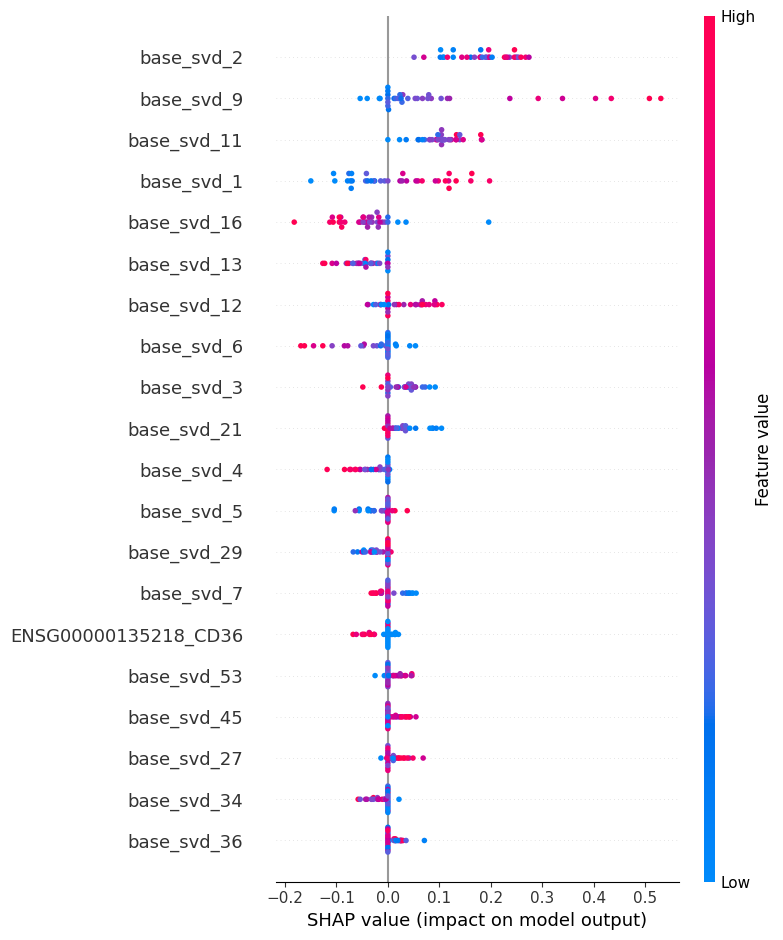

In [99]:
shap.initjs()
shap.summary_plot(shap_values[0], X_test_p.X, feature_names=X_test_p.var_names)

In [100]:
stop

NameError: name 'stop' is not defined

## Multi

In [ ]:
mlp_model_name = [
    'multi_mlp_all_con_16',
    'multi_mlp_all_con_32', 
    'multi_mlp_all_binary_16',
    'multi_mlp_all_last_cluster',
    'multi_mlp_all_lsi_w2v_col_128_flg',
    'multi_mlp_all_lsi_w2v_128_flg',
    'multi_mlp_all_lsi_128_flg',
    'multi_mlp_all_lsi_w2v_col_64_flg',
    'multi_mlp_all_lsi_w2v_64_flg',
    'multi_mlp_all_lsi_64_flg',
    'multi_mlp_all_okapi_128_flg',
    'multi_mlp_all_okapi_64_flg',
    'multi_mlp_all_colmean_64_flg',
    'multi_mlp_corr_con_16_flg',
    'multi_mlp_corr_con_32_flg',
    'multi_mlp_corr_binary_16',
    'multi_mlp_corr_lsi_add_lc_svd_flg',
    
    'multi_mlp_corr_lsi_w2v_col_128_flg',
    'multi_mlp_corr_lsi_w2v_col_64_flg',
    'multi_mlp_corr_lsi_w2v_128_flg',
    'multi_mlp_corr_lsi_w2v_64_flg',
    
    'multi_mlp_corr_lsi_128_flg',
    'multi_mlp_corr_lsi_64_flg',
    
    'multi_mlp_corr_colmean_64_flg',
    'multi_mlp_corr_okapi_w2v_64_flg',
    'multi_mlp_corr_okapi_64_flg',
    
             ]

In [ ]:
model_name_list = []

for i in mlp_model_name:
    for num, j in enumerate(os.listdir(multi_mlp_path)):
        if i in j:
            model_name_list.append(j)

print(len(model_name_list))
model_name_list

In [ ]:
weight = [2.5, 2.5, 2.5, 1.2, 1.2, 1.2, 1, 
          1.5, 1.5, 2.5, 0.5, 0.5, 0.5, 
          2.5, 2.5, 1.8, 0.8, 1, 0.8, 1 ,0.8, 1, 0.3, 
          0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
weight_sum = np.array(weight).sum()
weight_sum

model_feat_dict = {model_name_list[0]:['multi_test_con_16.pickle', 2.5],
                   model_name_list[1]:['multi_test_con_32.pickle', 2.5],
                   model_name_list[2]:['multi_test_binary_16.pickle', 2.5],
                   
                   model_name_list[3]:['multi_test_okapi_64_last_cluster.pickle', 1.2],
                   model_name_list[4]:['multi_test_lsi_w2v_col_128.pickle', 1.2],
                   model_name_list[5]:['multi_test_lsi_w2v_128.pickle', 1.2],
                   model_name_list[6]:['multi_test_okapi_lsi_128.pickle', 1],
                   
                   model_name_list[7]:['multi_test_lsi_w2v_col_64.pickle', 1.5],
                   model_name_list[8]:['multi_test_lsi_w2v_64.pickle', 1.5],
                   model_name_list[9]:['multi_test_okapi_lsi_64.pickle', 2.5],
                   
                   model_name_list[10]:['multi_test_okapi_feature_128.pickle', 0.5],
                   model_name_list[11]:['multi_test_okapi_feature_64.pickle', 0.5],
                   model_name_list[12]:['multi_test_okapi_w2v_col_64.pickle', 0.5],
                   
                   model_name_list[13]:['multi_test_con_16.pickle', 2.5],
                   model_name_list[14]:['multi_test_con_32.pickle', 2.5],
                   model_name_list[15]:['multi_test_binary_16.pickle', 1.8],
                   model_name_list[16]:['multi_test_lc_addsvd_64.pickle', 0.8],
                   
                   model_name_list[17]:['multi_test_lsi_w2v_col_128.pickle', 1],
                   model_name_list[18]:['multi_test_lsi_w2v_col_64.pickle', 0.8],
                   model_name_list[19]:['multi_test_lsi_w2v_128.pickle', 1],
                   model_name_list[20]:['multi_test_lsi_w2v_64.pickle', 0.8],
                   model_name_list[21]:['multi_test_okapi_lsi_128.pickle', 1],
                   model_name_list[22]:['multi_test_okapi_lsi_64.pickle', 0.3],
                   
                   model_name_list[23]:['multi_test_okapi_w2v_col_64.pickle', 0.3],
                   model_name_list[24]:['multi_test_okapi_w2v_64.pickle', 0.3],
                   model_name_list[25]:['multi_test_okapi_feature_64.pickle', 0.3],
                   
                   'lsi_128':['multi_test_okapi_lsi_128.pickle', 0.2],
                   'lsi_64':['multi_test_okapi_lsi_64.pickle', 0.2],
                   'lsi_w2v_col_64':['multi_test_lsi_w2v_col_64.pickle', 0.2],
                  }


### multi model

In [ ]:
class MultiDataset(Dataset):
    
    def __init__(self, feature, target):
        
        self.feature = feature
        self.target = target
        
    def __len__(self):
        return len(self.feature)
    
    def __getitem__(self, index):
                
        d = {
            "X": self.feature[index],
            "y" : self.target[index],
        }
        return d

In [ ]:
class MultiDataset_test(Dataset):
    
    def __init__(self, feature):
        self.feature = feature
        
    def __len__(self):
        return len(self.feature)
    
    def __getitem__(self, index):
                
        d = {
            "X": self.feature[index]
        }
        return d

In [ ]:
def partial_correlation_score_torch_faster(y_true, y_pred):
    """Compute the correlation between each rows of the y_true and y_pred tensors.
    Compatible with backpropagation.
    """
    y_true_centered = y_true - torch.mean(y_true, dim=1)[:,None]
    y_pred_centered = y_pred - torch.mean(y_pred, dim=1)[:,None]
    cov_tp = torch.sum(y_true_centered*y_pred_centered, dim=1)/(y_true.shape[1]-1)
    var_t = torch.sum(y_true_centered**2, dim=1)/(y_true.shape[1]-1)
    var_p = torch.sum(y_pred_centered**2, dim=1)/(y_true.shape[1]-1)
    return cov_tp/torch.sqrt(var_t*var_p)

def correl_loss(pred, tgt):
    """Loss for directly optimizing the correlation.
    """
    return -torch.mean(partial_correlation_score_torch_faster(tgt, pred))


def correlation_score(y_true, y_pred):
    """Scores the predictions according to the competition rules. 
    
    It is assumed that the predictions are not constant.
    
    Returns the average of each sample's Pearson correlation coefficient"""
    if type(y_true) == pd.DataFrame: y_true = y_true.values
    if type(y_pred) == pd.DataFrame: y_pred = y_pred.values
    if y_true.shape != y_pred.shape: raise ValueError("Shapes are different.")
    corrsum = 0
    for i in range(len(y_true)):
        corrsum += np.corrcoef(y_true[i], y_pred[i])[1, 0]
    return corrsum / len(y_true)

In [ ]:
class MultiModel(nn.Module):
    
    def __init__(self, feature_num):
        super(MultiModel, self).__init__()
        
        self.layer_seq_128 = nn.Sequential(nn.Linear(feature_num, 128),
                                           nn.LayerNorm(128),
                                           nn.ReLU(),
                                      )
        
        self.layer_seq_64 = nn.Sequential(nn.Linear(128, 64),
                                           nn.LayerNorm(64),
                                           nn.ReLU(),
                                      )
        
        self.layer_seq_32 = nn.Sequential(nn.Linear(64, 32),
                                   nn.LayerNorm(32),
                                   nn.ReLU(),
                              )
        
        self.layer_seq_8 = nn.Sequential(nn.Linear(32, 8),
                                         nn.LayerNorm(8),
                                         nn.ReLU(),
                                      )
        
        self.head = nn.Linear(128 + 64 + 32 + 8, target_num)
                   
    def forward(self, X, y=None):
        
        X_128 = self.layer_seq_128(X)
        X_64 = self.layer_seq_64(X_128)
        X_32 = self.layer_seq_32(X_64)
        X_8 = self.layer_seq_8(X_32)
        X = torch.cat([X_128, X_64, X_32, X_8], axis = 1)
        out = self.head(X)
        
        return out

In [ ]:
def train_loop(model, optimizer, loader, epoch):
    
    losses, lrs = [], []
    model.train()
    optimizer.zero_grad()
    loss_fn = nn.MSELoss()
    
    with tqdm(total=len(loader),unit="batch") as pbar:
        pbar.set_description(f"Epoch{epoch}")
        
        for d in loader:
            X = d['X'].to(device).float()
            y = d['y'].to(device)
            
            logits = model(X)
            #loss = correl_loss(logits, y)
            loss = torch.sqrt(loss_fn(logits, y))
        
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            pbar.set_postfix({"loss":loss.item()})
            pbar.update(1)

    return model

In [ ]:
def valid_loop(model, loader, y_val):
    
    model.eval()
    partial_correlation_scores = []
    oof_pred = []
    loss_fn = nn.MSELoss()
    
    for d in loader:
        with torch.no_grad():
            val_X = d['X'].to(device).float()
            val_y = d['y'].to(device)
            logits = model(val_X)
            #oof_pred.append(logits.detach().cpu().numpy())
            oof_pred.append(logits)
    
    y_val = torch.tensor(y_val).to(device)
    logits = torch.cat(oof_pred)
    #print(logits.shape, y_val.shape)
    loss = torch.sqrt(loss_fn(logits, y_val))
    logits = logits.detach().cpu().numpy()
    
    return logits, loss

In [ ]:
def test_loop(model, loader):
    
    model.eval()
    predicts=[]

    for d in tqdm(loader):
        with torch.no_grad():
            X = d['X'].to(device).float()
            logits = model(X)
            predicts.append(logits.detach().cpu().numpy())
            
    return np.concatenate(predicts)

In [ ]:
pred = np.zeros([55935, 23418])
svd = pickle.load(open(multi_target_path + 'multi_all_target_128.pkl', 'rb'))

for num, i in enumerate(model_feat_dict.keys()):
    
    print(i)
    
    if 'mlp' in i:
        
        test_file = model_feat_dict[i][0]
        test_weight = model_feat_dict[i][1]
        X_test = pd.read_pickle(multi_feature_path  + test_file)    
        X_test = np.array(X_test)
        feature_dims = X_test.shape[1]

        test_ds = MultiDataset_test(X_test)
        test_dataloader = DataLoader(test_ds, batch_size=128, pin_memory=True, 
                                     shuffle=False, drop_last=False, num_workers=4)
        
        if 'all' in i:
            target_num = 23418
        else:
            target_num = 128
        
        model = MultiModel(feature_dims)    
        model = model.to(device)
        model.load_state_dict(torch.load(f'{multi_mlp_path}/{i}'))
        
        result = test_loop(model, test_dataloader).astype(np.float32)
        
        if 'all' not in i:
            result = result@svd.components_
                
        result = result * test_weight / weight_sum
        pred += result

        torch.cuda.empty_cache()
        
    else:
        test_file = model_feat_dict[i][0]
        test_weight = model_feat_dict[i][1]
        X_test = pd.read_pickle(multi_feature_path  + test_file)
        
        cb_pred = np.zeros([55935, 128])
        
        for t in tqdm(range(128)): 
            cb_model_path = [j for j in os.listdir(multi_cb_path) if f'cb_{t}_{i}' in j][0]
            cb = pickle.load(open(multi_cb_path + cb_model_path, 'rb'))
            cb_pred[:,t] = cb.predict(X_test)
            
        cb_pred = cb_pred.astype(np.float32)
        cb_pred = cb_pred@svd.components_
        pred += cb_pred * test_weight / weight_sum
        
        #del cb_pred

In [ ]:
multi_sub = pd.DataFrame(pred.round(6)).astype(np.float32)

In [ ]:
del pred
gc.collect()

## Postprocess

In [ ]:
preprocess_path = '../../../../summary/input/preprocess/'

#### first: fix cite output

In [ ]:
test_sub_ids = np.load(preprocess_path + "cite/test_cite_inputs_idxcol.npz", allow_pickle=True)
test_sub_ids = test_sub_ids["index"]
test_raw_ids = np.load(preprocess_path + "cite/test_cite_raw_inputs_idxcol.npz", allow_pickle=True)
test_raw_ids = test_raw_ids["index"]

In [ ]:
test_cite_df = pd.DataFrame(test_sub_ids, columns = ['cell_id'])
cite_sub['cell_id'] = test_raw_ids
test_cite_df = test_cite_df.merge(cite_sub, on = 'cell_id', how = 'left')
test_cite_df.fillna(0, inplace = True)
test_cite_df.drop(['cell_id'], axis = 1, inplace = True)

cite_sub = test_cite_df.copy()

### preprocess

In [ ]:
sub = pd.read_csv(raw_path + "sample_submission.csv")  
eval_ids = pd.read_csv(raw_path + "evaluation_ids.csv") 

cite_cols = pd.read_csv(preprocess_path + "cite/cite_test_cols.csv") 
cite_index = pd.read_csv(preprocess_path + "cite/cite_test_indexs.csv") 
cite_index.columns = ['cell_id']

multi_cols = pd.read_csv(preprocess_path + "multi/multi_test_cols.csv") 
multi_index = pd.read_csv(preprocess_path + "multi/multi_test_indexs.csv") 
multi_index.columns = ['cell_id']

submission = pd.Series(name='target',index=pd.MultiIndex.from_frame(eval_ids), dtype=np.float32)

### multi

In [ ]:
multi_sub = np.array(multi_sub)

In [ ]:
cell_dict = dict((k,v) for v,k in enumerate(np.array(multi_index['cell_id'])))
assert len(cell_dict)  == len(multi_index['cell_id'])

gene_dict = dict((k,v) for v,k in enumerate(np.array(multi_cols['gene_id']))) 
assert len(gene_dict)  == len(multi_cols['gene_id'])

eval_ids_cell_num = eval_ids.cell_id.apply(lambda x:cell_dict.get(x, -1))
eval_ids_gene_num = eval_ids.gene_id.apply(lambda x:gene_dict.get(x, -1))

valid_multi_rows = (eval_ids_gene_num !=-1) & (eval_ids_cell_num!=-1)
submission.iloc[valid_multi_rows] = multi_sub[eval_ids_cell_num[valid_multi_rows].to_numpy(),
                                                 eval_ids_gene_num[valid_multi_rows].to_numpy()]

### cite

In [ ]:
cite_sub = np.array(cite_sub)

In [ ]:
cell_dict = dict((k,v) for v,k in enumerate(np.array(cite_index['cell_id'])))
assert len(cell_dict)  == len(cite_index['cell_id'])

gene_dict = dict((k,v) for v,k in enumerate(np.array(cite_cols['gene_id']))) 
assert len(gene_dict)  == len(cite_cols['gene_id'])

eval_ids_cell_num = eval_ids.cell_id.apply(lambda x:cell_dict.get(x, -1))
eval_ids_gene_num = eval_ids.gene_id.apply(lambda x:gene_dict.get(x, -1))

valid_multi_rows = (eval_ids_gene_num !=-1) & (eval_ids_cell_num!=-1)

In [ ]:
submission.iloc[valid_multi_rows] = cite_sub[eval_ids_cell_num[valid_multi_rows].to_numpy(),
                                                 eval_ids_gene_num[valid_multi_rows].to_numpy()]

### make submission

In [ ]:
submission = submission.round(6)
submission = pd.DataFrame(submission, columns = ['target'])
submission = submission.reset_index()

In [ ]:
submission[['row_id', 'target']].to_csv(output_path + 'submission.csv', index = False)

In [ ]:
#!kaggle competitions submit -c open-problems-multimodal -f $sub_name_csv -m $message